In [1]:
import numpy as np
import pandas as pd

# Cargar el array desde el archivo .npy
data = np.load('/Volumes/copia seguridad1/TFG_Prueba/Datos_iniciales/windows_partitioned/by_transect/dl/Transecto_1/test_X.npy')

# Convertir a DataFrame de pandas (opcional, pero facilita el guardado)
df = pd.DataFrame(data)

# analizar el DataFrame
df.info()

#


ValueError: Must pass 2-d input. shape=(4250, 72, 23)

In [2]:
import numpy as np
import pandas as pd

# 1. Cargar el array .npy
ruta = '/Volumes/copia seguridad1/TFG_Prueba/Datos_iniciales/windows_partitioned/by_transect/dl/Transecto_1/test_X.npy'
data = np.load(ruta)

print("Dimensiones originales:", data.shape)

# 2. Si es 3D (n_muestras, 72, n_features), aplanar a 2D (n_muestras, 72 * n_features)
if data.ndim == 3:
    n_muestras, pasos, n_features = data.shape
    data_2d = data.reshape(n_muestras, pasos * n_features)
    print(f"Reestructurado a 2D: {data_2d.shape} (filas, columnas)")
else:
    data_2d = data

# 3. Convertir a DataFrame
df = pd.DataFrame(data_2d)

# 4. Información general
print("\n" + "="*50)
print("RESUMEN GENERAL DEL DATAFRAME")
print("="*50)
print(f"Número de filas (muestras): {df.shape[0]}")
print(f"Número de columnas (variables): {df.shape[1]}")
print("\nTipos de datos por columna:")
print(df.dtypes.value_counts())
print("\nValores nulos por columna (primeras 10):")
print(df.isnull().sum().head(10))
if df.isnull().sum().sum() > 0:
    print(f"Total de valores nulos: {df.isnull().sum().sum()}")

# 5. Estadísticas descriptivas básicas (para todas las columnas)
print("\n" + "="*50)
print("ESTADÍSTICAS DESCRIPTIVAS")
print("="*50)
# describe() por defecto solo para columnas numéricas
desc = df.describe(percentiles=[0.01,.25, .5, .75, 0.99]).transpose()
print(desc)

# 6. (Opcional) Guardar el resumen en un CSV
desc.to_csv('resumen_estadistico.csv')
print("\nResumen guardado como 'resumen_estadistico.csv'")

# 7. (Opcional) Mostrar matriz de correlación (si no hay demasiadas columnas)
if df.shape[1] <= 20:
    print("\n" + "="*50)
    print("MATRIZ DE CORRELACIÓN (primeras 20 columnas)")
    print("="*50)
    corr = df.corr()
    print(corr)
else:
    print("\nDemasiadas columnas para mostrar correlación completa.")

Dimensiones originales: (4250, 72, 23)
Reestructurado a 2D: (4250, 1656) (filas, columnas)

RESUMEN GENERAL DEL DATAFRAME
Número de filas (muestras): 4250
Número de columnas (variables): 1656

Tipos de datos por columna:
float32    1656
Name: count, dtype: int64

Valores nulos por columna (primeras 10):
0    0
1    0
2    0
3    0
4    0
5    0
6    0
7    0
8    0
9    0
dtype: int64

ESTADÍSTICAS DESCRIPTIVAS
       count      mean       std       min        1%       25%       50%  \
0     4250.0  0.011373  0.026874  0.000000  0.000000  0.004107  0.005476   
1     4250.0  0.065359  0.094286  0.000000  0.003547  0.012821  0.025641   
2     4250.0  0.025420  0.039810  0.002041  0.002041  0.007143  0.011224   
3     4250.0  0.365536  0.151462  0.004425  0.037611  0.247788  0.383850   
4     4250.0  0.133903  0.135299  0.005051  0.005051  0.030303  0.085859   
...      ...       ...       ...       ...       ...       ...       ...   
1651  4250.0  1.000000  0.000000  1.000000  1.000000 

In [ ]:
# Guardar como CSV
df.to_csv('archivo.csv', index=False)

# Ver si hay NAN

In [3]:
import pandas as pd
import os
import sys

def revisar_nan_en_csv(rutas_archivos):
    """
    Revisa valores NaN en cada columna de uno o más archivos CSV.
    
    Parámetros:
    rutas_archivos (list): Lista de rutas a archivos CSV.
    """
    for ruta in rutas_archivos:
        if not os.path.exists(ruta):
            print(f"⚠️  Archivo no encontrado: {ruta}")
            continue
        
        try:
            # Intentar leer el CSV con codificación UTF-8; si falla, probar latin1
            df = pd.read_csv(ruta, encoding='utf-8')
        except UnicodeDecodeError:
            df = pd.read_csv(ruta, encoding='latin1')
        except Exception as e:
            print(f"❌ Error al leer {ruta}: {e}")
            continue
        
        print(f"\n📁 Archivo: {os.path.basename(ruta)}")
        
        # Verificar si hay al menos un NaN en todo el DataFrame
        if df.isna().any().any():
            # Iterar sobre cada columna que tenga al menos un NaN
            for col in df.columns[df.isna().any()]:
                # Obtener índices (0-based) donde la columna es NaN
                filas_nan = df[df[col].isna()].index.tolist()
                # Convertir a 1-based para facilidad del usuario
                filas_nan_1based = [f+1 for f in filas_nan]
                print(f"   🔸 Columna '{col}': filas {filas_nan_1based}")
        else:
            print("   ✅ No se encontraron valores NaN en este archivo.")

if __name__ == "__main__":
    # Ejemplo de uso: lista de rutas a tus archivos CSV
    archivos_csv = [
        "/Volumes/copia seguridad1/TFG_Prueba/Datos_iniciales/imputed_global/T1_E1_Alicante.csv",
        "/Volumes/copia seguridad1/TFG_Prueba/Datos_iniciales/imputed_global/T1_E2_Elda.csv",
        "/Volumes/copia seguridad1/TFG_Prueba/Datos_iniciales/imputed_global/T2_E1_Elche.csv",
        "/Volumes/copia seguridad1/TFG_Prueba/Datos_iniciales/imputed_global/T2_E2_Elda.csv",
        "/Volumes/copia seguridad1/TFG_Prueba/Datos_iniciales/imputed_by_transect/Transecto_1.csv",
        "/Volumes/copia seguridad1/TFG_Prueba/Datos_iniciales/imputed_by_transect/Transecto_2.csv"

     ]
    
    # También podrías tomar las rutas desde argumentos de línea de comandos:
    # archivos_csv = sys.argv[1:] if len(sys.argv) > 1 else archivos_csv
    
    revisar_nan_en_csv(archivos_csv)


📁 Archivo: T1_E1_Alicante.csv
   ✅ No se encontraron valores NaN en este archivo.

📁 Archivo: T1_E2_Elda.csv
   ✅ No se encontraron valores NaN en este archivo.

📁 Archivo: T2_E1_Elche.csv
   ✅ No se encontraron valores NaN en este archivo.

📁 Archivo: T2_E2_Elda.csv
   ✅ No se encontraron valores NaN en este archivo.

📁 Archivo: Transecto_1.csv
   ✅ No se encontraron valores NaN en este archivo.

📁 Archivo: Transecto_2.csv
   ✅ No se encontraron valores NaN en este archivo.


# Quitar Columnas extra

In [8]:
import pandas as pd
import os

# Lista de rutas de archivos CSV de entrada
archivos_csv = [
    "/Volumes/copia seguridad1/imputed_transect/Transecto_1.csv",
    "/Volumes/copia seguridad1/imputed_transect/Transecto_2.csv",
    "/Volumes/copia seguridad1/imputed_transect/Transecto_3.csv",
    "/Volumes/copia seguridad1/imputed_transect/Transecto_4.csv",
    "/Volumes/copia seguridad1/imputed_transect/Transecto_6.csv",
    "/Volumes/copia seguridad1/imputed_transect/Transecto_7.csv",
    "/Volumes/copia seguridad1/imputed_transect/Transecto_8.csv",
]

# Ruta de salida
output_dir = "/Volumes/copia seguridad1/Imputed_Transect"

# Crear el directorio de salida si no existe
os.makedirs(output_dir, exist_ok=True)

# Columnas a eliminar (pueden aparecer múltiples veces)
columnas_a_eliminar = {"physical_error", "physical_reason", "outlier_stl", "outlier_jump", "outlier_iso", "sensor_error", "evento_real", "doubtful", "Pres."}

# Procesar cada archivo
for archivo in archivos_csv:
    try:
        # Leer el archivo CSV
        df = pd.read_csv(archivo)
        
        # Identificar las columnas que coinciden con las que queremos eliminar
        columnas_existentes = df.columns.tolist()
        columnas_a_quitar = [col for col in columnas_existentes if col in columnas_a_eliminar]
        
        if columnas_a_quitar:
            # Eliminar las columnas
            df = df.drop(columns=columnas_a_quitar)
            print(f"Archivo {os.path.basename(archivo)}: eliminadas {len(columnas_a_quitar)} columna(s) ({', '.join(set(columnas_a_quitar))})")
        else:
            print(f"Archivo {os.path.basename(archivo)}: no se encontraron columnas para eliminar")
        
        # Construir la ruta de salida (mismo nombre en la nueva carpeta)
        nombre_archivo = os.path.basename(archivo)
        ruta_salida = os.path.join(output_dir, nombre_archivo)
        
        # Guardar el DataFrame resultante
        df.to_csv(ruta_salida, index=False)
        print(f"Guardado en: {ruta_salida}\n")
        
    except FileNotFoundError:
        print(f"Error: No se encontró el archivo {archivo}\n")
    except Exception as e:
        print(f"Error al procesar {archivo}: {e}\n")

Archivo Transecto_1.csv: eliminadas 9 columna(s) (outlier_jump, Pres., outlier_stl, sensor_error, outlier_iso, evento_real, doubtful, physical_error, physical_reason)
Guardado en: /Volumes/copia seguridad1/Imputed_Transect/Transecto_1.csv

Archivo Transecto_2.csv: eliminadas 9 columna(s) (outlier_jump, Pres., outlier_stl, sensor_error, outlier_iso, evento_real, doubtful, physical_error, physical_reason)
Guardado en: /Volumes/copia seguridad1/Imputed_Transect/Transecto_2.csv



/var/folders/y_/8n8k4c3130sbkdjs9tb0_pv80000gp/T/ipykernel_80622/4167512552.py:28: DtypeWarning: Columns (0: physical_reason) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(archivo)


Archivo Transecto_3.csv: eliminadas 9 columna(s) (outlier_jump, Pres., outlier_stl, sensor_error, outlier_iso, evento_real, doubtful, physical_error, physical_reason)
Guardado en: /Volumes/copia seguridad1/Imputed_Transect/Transecto_3.csv



/var/folders/y_/8n8k4c3130sbkdjs9tb0_pv80000gp/T/ipykernel_80622/4167512552.py:28: DtypeWarning: Columns (0: physical_reason) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(archivo)


Archivo Transecto_4.csv: eliminadas 9 columna(s) (outlier_jump, Pres., outlier_stl, sensor_error, outlier_iso, evento_real, doubtful, physical_error, physical_reason)
Guardado en: /Volumes/copia seguridad1/Imputed_Transect/Transecto_4.csv



/var/folders/y_/8n8k4c3130sbkdjs9tb0_pv80000gp/T/ipykernel_80622/4167512552.py:28: DtypeWarning: Columns (0: physical_error, 1: outlier_stl, 2: outlier_jump, 3: outlier_iso, 4: sensor_error, 5: evento_real, 6: doubtful) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(archivo)


Archivo Transecto_6.csv: eliminadas 9 columna(s) (outlier_jump, Pres., outlier_stl, sensor_error, outlier_iso, evento_real, doubtful, physical_error, physical_reason)
Guardado en: /Volumes/copia seguridad1/Imputed_Transect/Transecto_6.csv

Archivo Transecto_7.csv: eliminadas 1 columna(s) (Pres.)
Guardado en: /Volumes/copia seguridad1/Imputed_Transect/Transecto_7.csv

Archivo Transecto_8.csv: eliminadas 1 columna(s) (Pres.)
Guardado en: /Volumes/copia seguridad1/Imputed_Transect/Transecto_8.csv



# Mirar distrubucion predicciones

Train O3: min = 1.0 max = 144.0
Test  O3: min = 5.0 max = 157.5


/Users/benjamincarbonellminana/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


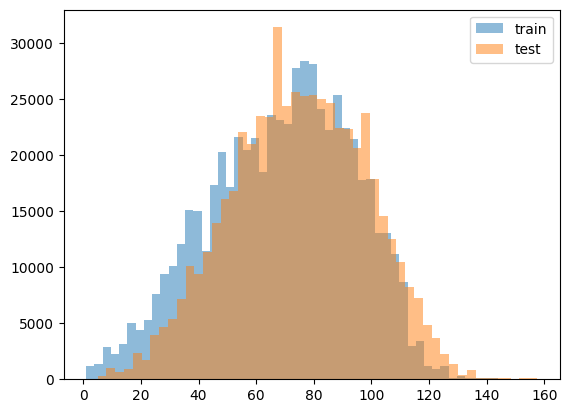

In [2]:
import numpy as np

train_y = np.load("/Volumes/copia seguridad1/TFG_Prueba/Datos_iniciales/windows_partitioned/by_transect/ml/Transecto_2/ml_2d/train_y.npy")
test_y  = np.load("/Volumes/copia seguridad1/TFG_Prueba/Datos_iniciales/windows_partitioned/by_transect/ml/Transecto_2/ml_2d/test_y.npy")

print("Train O3: min =", train_y.min(), "max =", train_y.max())
print("Test  O3: min =", test_y.min(),  "max =", test_y.max())
import matplotlib.pyplot as plt
plt.hist(train_y.ravel(), bins=50, alpha=0.5, label='train')
plt.hist(test_y.ravel(), bins=50, alpha=0.5, label='test')
plt.legend()
plt.show()

# pasar de por transectos a por estaciones

In [1]:
import pandas as pd
from pathlib import Path

# =========================
# CONFIGURACIÓN
# =========================

# Carpeta donde están los CSV de entrada
input_dir = Path(r"/Volumes/copia seguridad1/Imputed_Transect")

# Carpeta donde guardar los nuevos CSV
output_dir = Path(r"/Volumes/copia seguridad1/Imputed_Transect/por_estacion_transecto")
output_dir.mkdir(parents=True, exist_ok=True)

# Columnas esperadas
numeric_cols = ["NO", "NO2", "NOx", "Veloc.", "Direc.", "Temp.", "R.Sol.", "Angulo", "Dist."]
categorical_cols = ["Estacion", "Transecto"]
all_cols = ["Datetime"] + numeric_cols + categorical_cols

# =========================
# FUNCIONES AUXILIARES
# =========================

def clean_name(x):
    """Limpia nombres para poder usarlos en el nombre del archivo."""
    return str(x).strip().replace("/", "_").replace("\\", "_").replace(" ", "_")

# =========================
# LEER TODOS LOS CSV
# =========================

dfs = []

csv_files = sorted(input_dir.glob("*.csv"))

if not csv_files:
    raise FileNotFoundError(f"No se han encontrado archivos .csv en: {input_dir}")

for file in csv_files:
    print(f"Leyendo: {file.name}")
    df = pd.read_csv(file)

    # Nos quedamos solo con las columnas esperadas, si existen
    cols_presentes = [col for col in all_cols if col in df.columns]
    df = df[cols_presentes].copy()

    # Convertir columnas numéricas
    for col in numeric_cols:
        if col in df.columns:
            df[col] = pd.to_numeric(df[col], errors="coerce")

    # Convertir Datetime
    if "Datetime" in df.columns:
        df["Datetime"] = pd.to_datetime(df["Datetime"], errors="coerce")

    dfs.append(df)

# Unimos todos los archivos
data = pd.concat(dfs, ignore_index=True)

# =========================
# GENERAR UN CSV POR ESTACIÓN + TRANSECTO
# =========================

# Quitamos filas sin estación o transecto
data = data.dropna(subset=["Estacion", "Transecto"])

# Agrupar y guardar un archivo por cada grupo
for (estacion, transecto), group in data.groupby(["Estacion", "Transecto"], dropna=True):
    est_name = clean_name(estacion)
    tran_name = clean_name(transecto)

    output_file = output_dir / f"Est_{est_name}_Tran_{tran_name}.csv"

    group.to_csv(output_file, index=False)
    print(f"Guardado: {output_file.name}")

Leyendo: Transecto_1.csv
Leyendo: Transecto_2.csv
Leyendo: Transecto_3.csv
Leyendo: Transecto_4.csv
Leyendo: Transecto_6.csv
Leyendo: Transecto_7.csv
Leyendo: Transecto_8.csv
Guardado: Est_Estacion_1_Tran_Transecto_1.csv
Guardado: Est_Estacion_1_Tran_Transecto_2.csv
Guardado: Est_Estacion_1_Tran_Transecto_3.csv
Guardado: Est_Estacion_1_Tran_Transecto_4.csv
Guardado: Est_Estacion_1_Tran_Transecto_6.csv
Guardado: Est_Estacion_1_Tran_Transecto_7.csv
Guardado: Est_Estacion_1_Tran_Transecto_8.csv
Guardado: Est_Estacion_2_Tran_Transecto_1.csv
Guardado: Est_Estacion_2_Tran_Transecto_2.csv
Guardado: Est_Estacion_2_Tran_Transecto_3.csv
Guardado: Est_Estacion_2_Tran_Transecto_4.csv
Guardado: Est_Estacion_2_Tran_Transecto_6.csv
Guardado: Est_Estacion_2_Tran_Transecto_7.csv
Guardado: Est_Estacion_2_Tran_Transecto_8.csv
Guardado: Est_Estacion_3_Tran_Transecto_7.csv
Guardado: Est_Estacion_3_Tran_Transecto_8.csv
Guardado: Est_T1_E1_Alicante_Tran_Transecto_1.csv
Guardado: Est_T1_E2_Elda_Tran_Transecto

# Ver distribucion variables antes de imputar

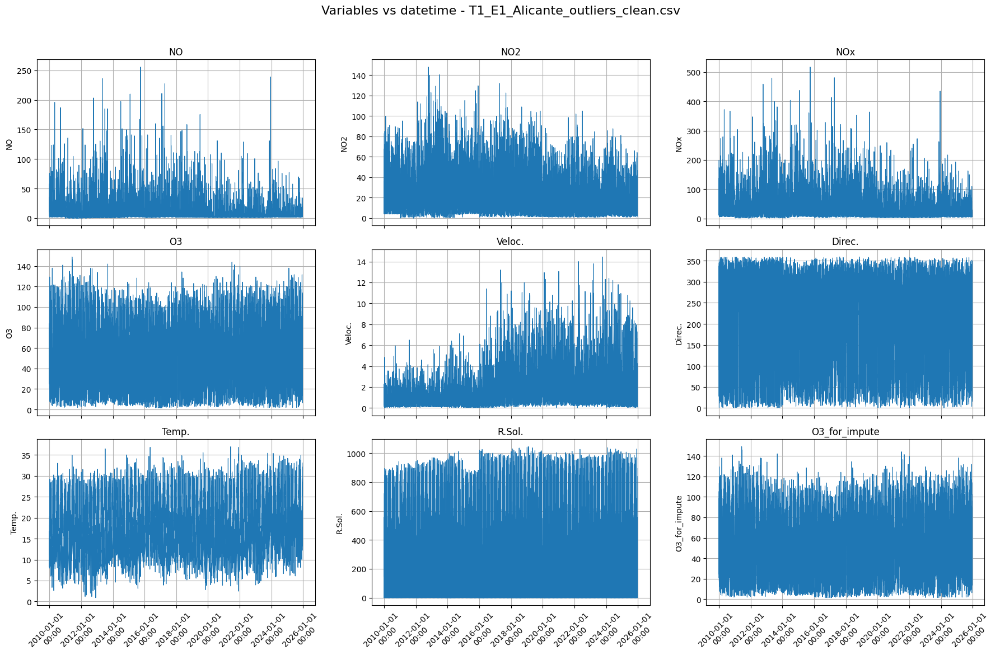

/var/folders/y_/8n8k4c3130sbkdjs9tb0_pv80000gp/T/ipykernel_1458/3301309580.py:72: UserWarning: Parsing dates in %Y-%m-%d %H:%M:%S format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  df[datetime_col] = pd.to_datetime(df[datetime_col], errors="coerce", dayfirst=True)


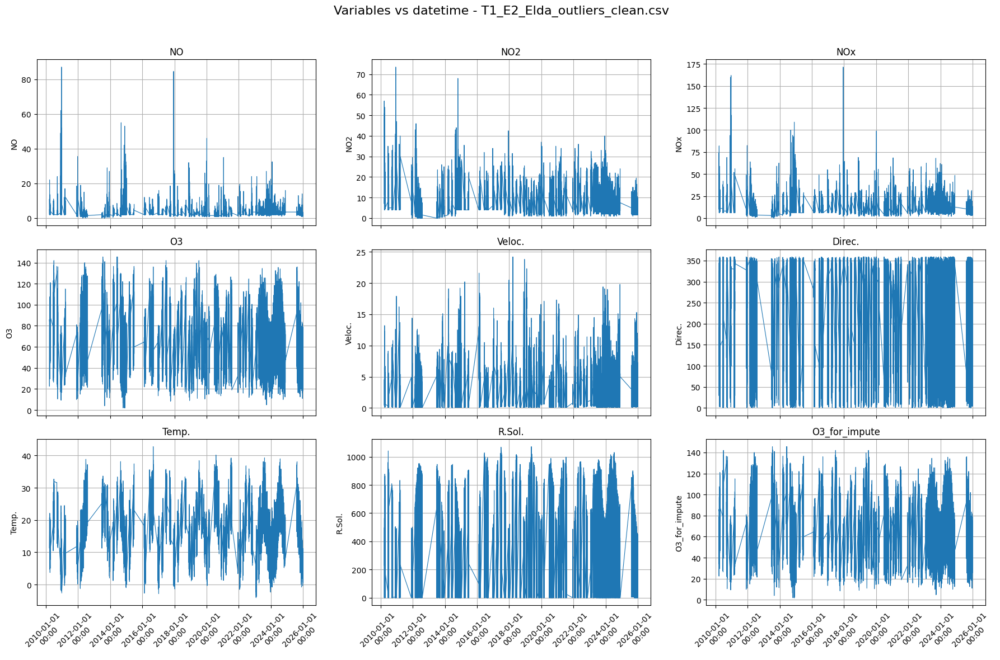

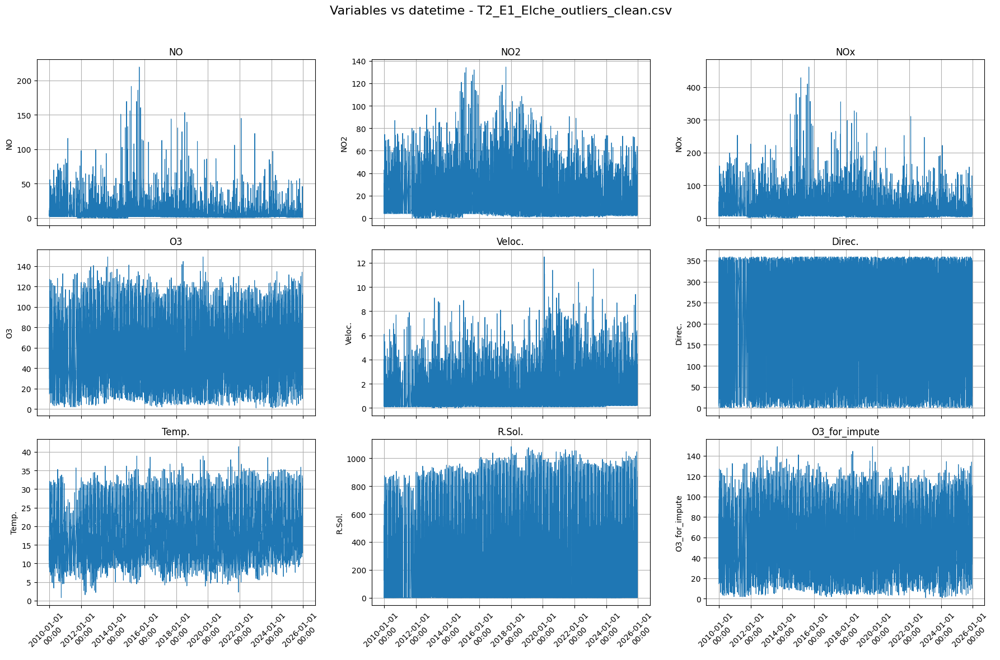

/var/folders/y_/8n8k4c3130sbkdjs9tb0_pv80000gp/T/ipykernel_1458/3301309580.py:72: UserWarning: Parsing dates in %Y-%m-%d %H:%M:%S format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  df[datetime_col] = pd.to_datetime(df[datetime_col], errors="coerce", dayfirst=True)


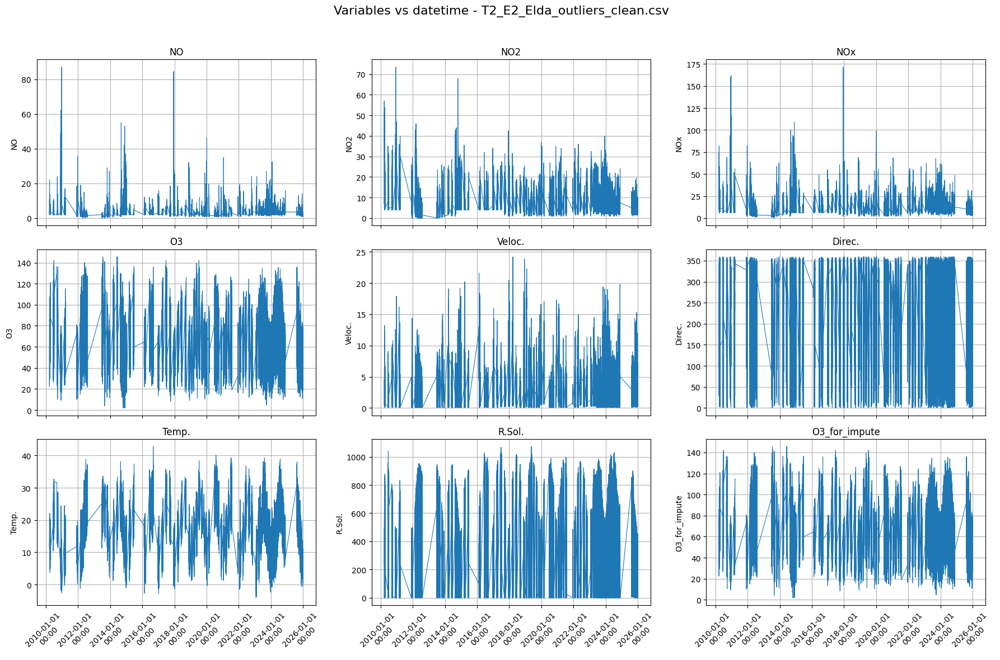

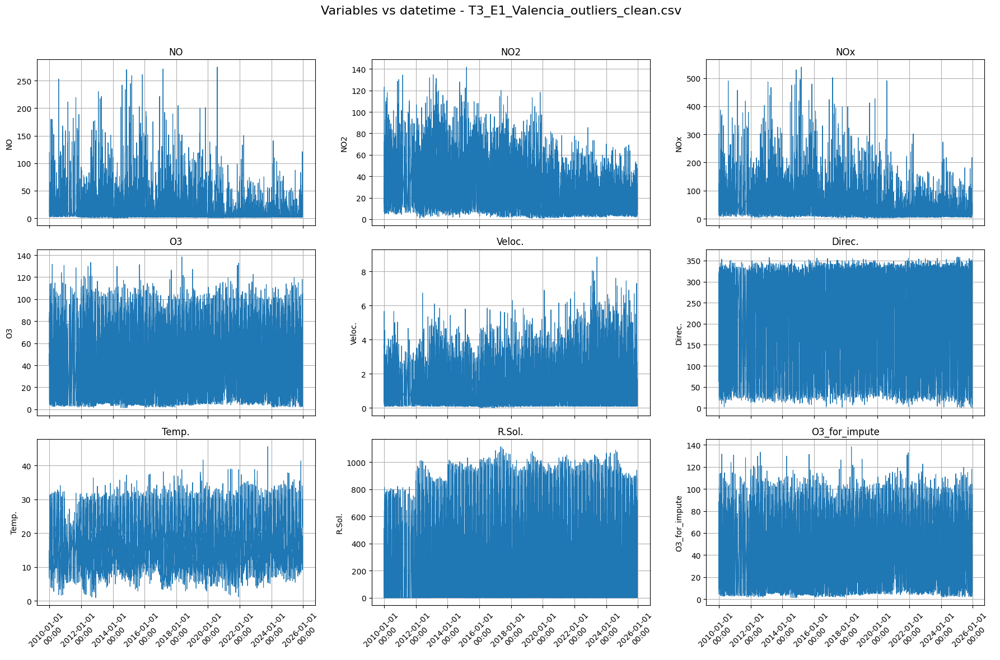

/var/folders/y_/8n8k4c3130sbkdjs9tb0_pv80000gp/T/ipykernel_1458/3301309580.py:72: UserWarning: Parsing dates in %Y-%m-%d %H:%M:%S format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  df[datetime_col] = pd.to_datetime(df[datetime_col], errors="coerce", dayfirst=True)


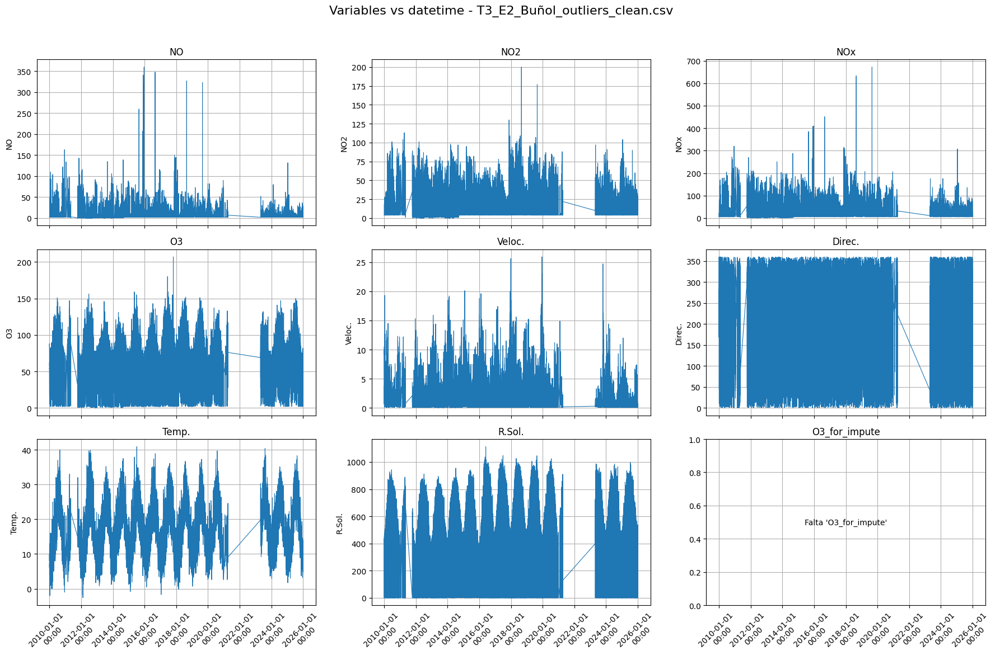

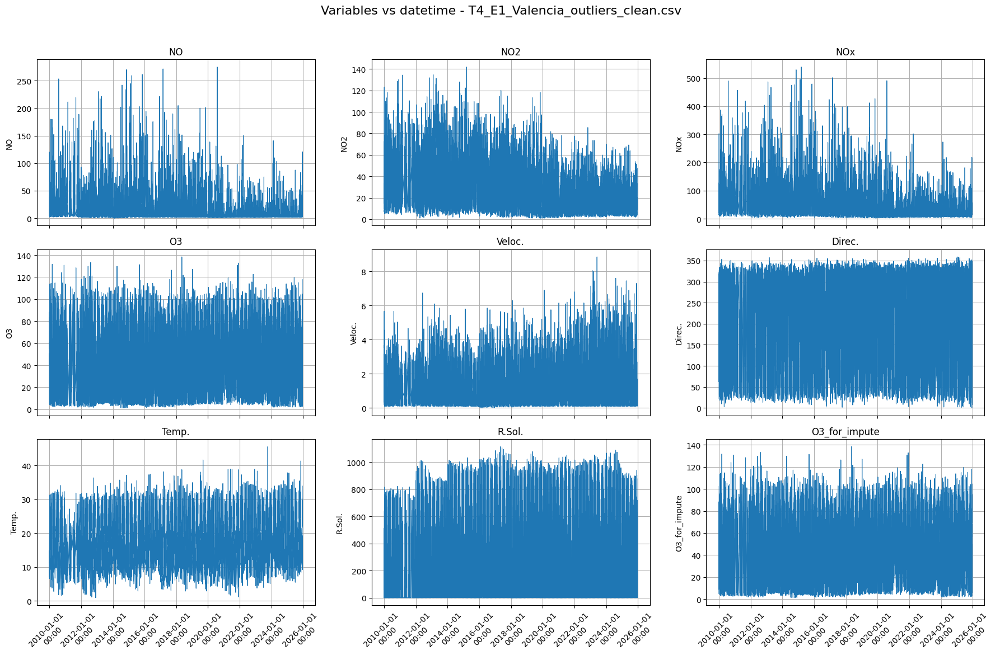

/var/folders/y_/8n8k4c3130sbkdjs9tb0_pv80000gp/T/ipykernel_1458/3301309580.py:72: UserWarning: Parsing dates in %Y-%m-%d %H:%M:%S format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  df[datetime_col] = pd.to_datetime(df[datetime_col], errors="coerce", dayfirst=True)


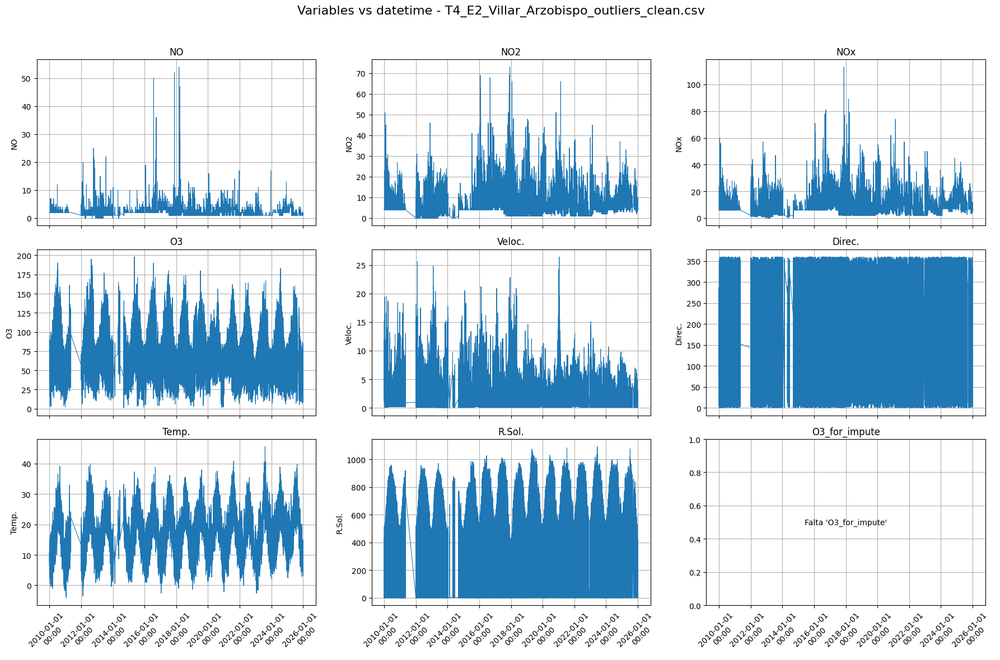

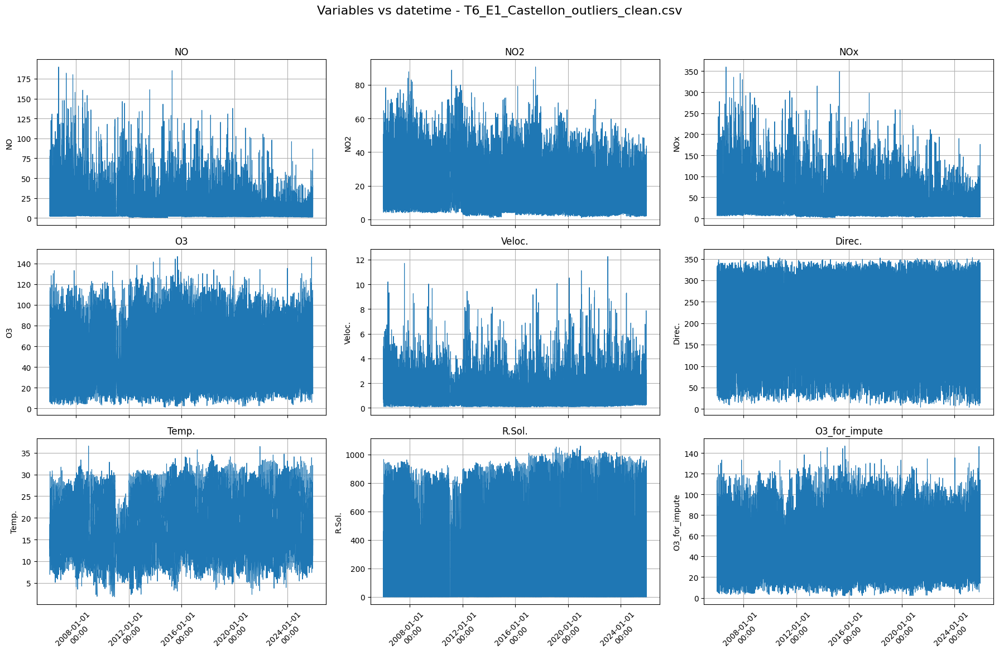

/var/folders/y_/8n8k4c3130sbkdjs9tb0_pv80000gp/T/ipykernel_1458/3301309580.py:72: UserWarning: Parsing dates in %Y-%m-%d %H:%M:%S format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  df[datetime_col] = pd.to_datetime(df[datetime_col], errors="coerce", dayfirst=True)


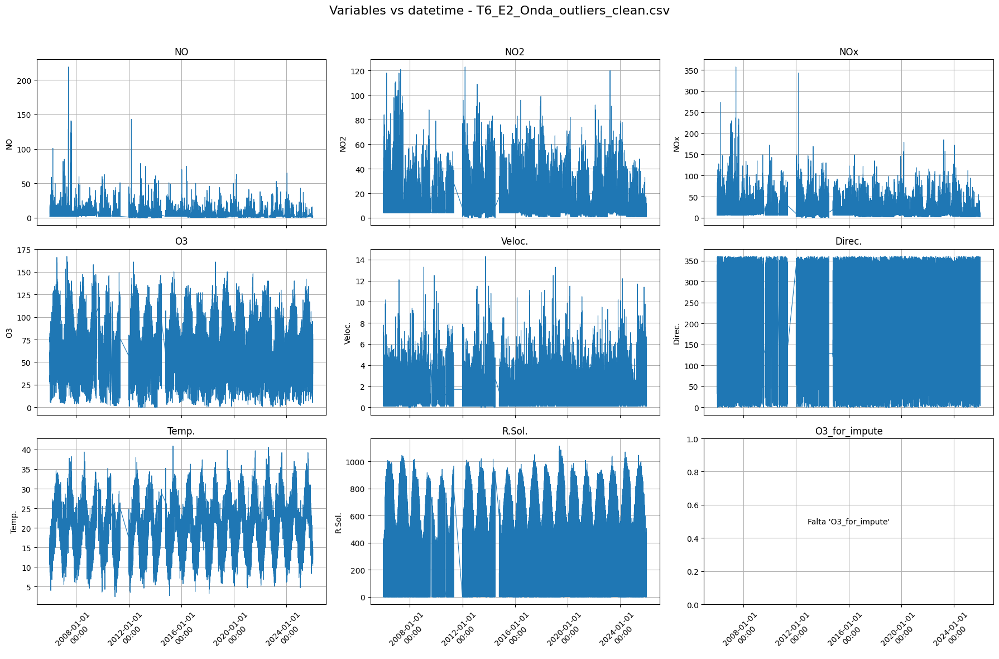

/var/folders/y_/8n8k4c3130sbkdjs9tb0_pv80000gp/T/ipykernel_1458/3301309580.py:72: UserWarning: Parsing dates in %Y-%m-%d %H:%M:%S format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  df[datetime_col] = pd.to_datetime(df[datetime_col], errors="coerce", dayfirst=True)


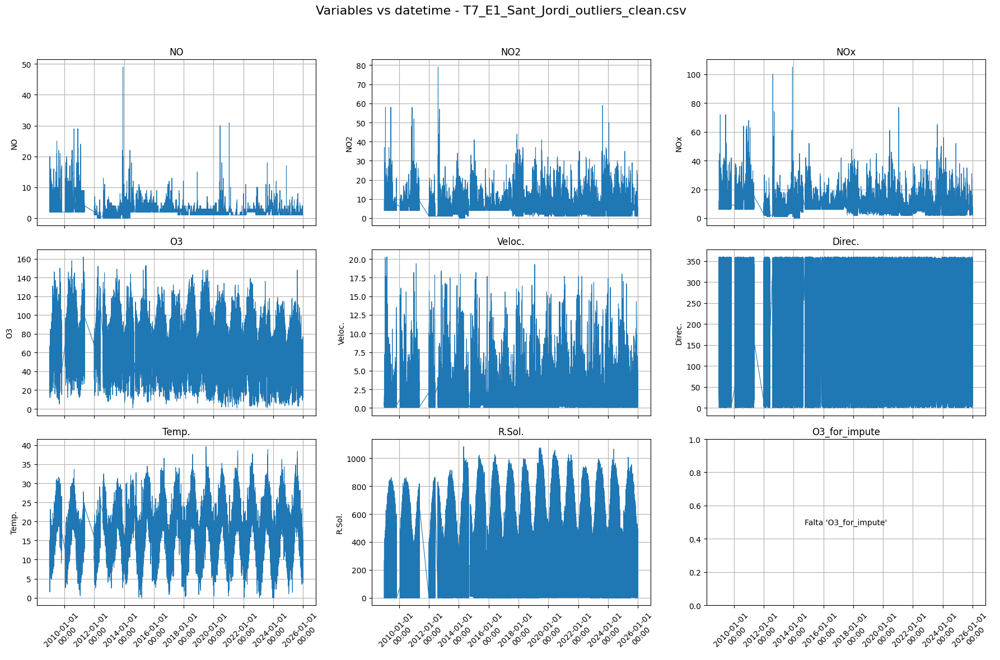

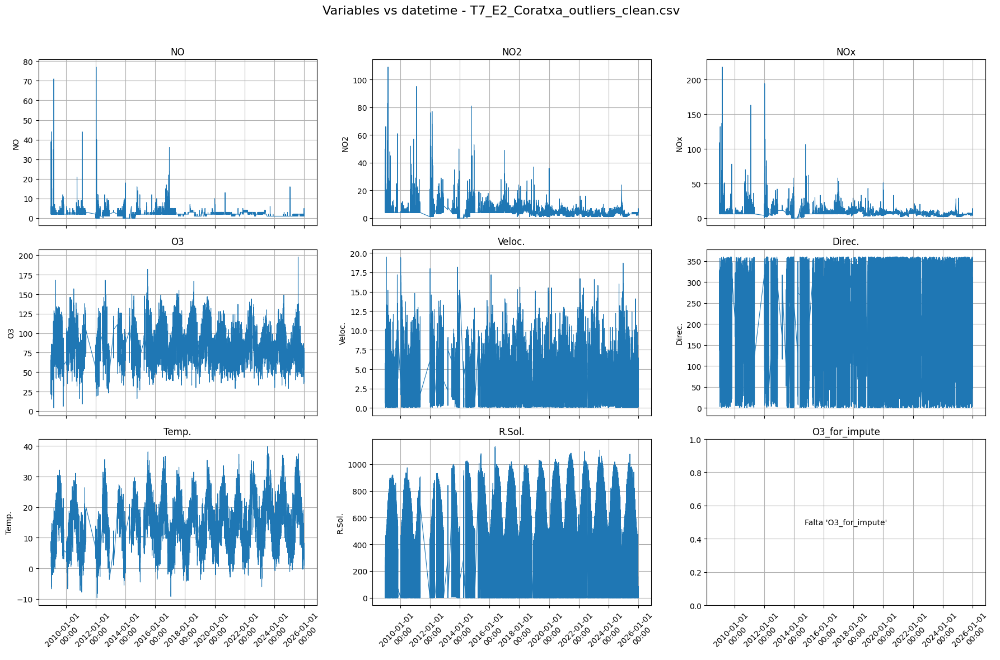

/var/folders/y_/8n8k4c3130sbkdjs9tb0_pv80000gp/T/ipykernel_1458/3301309580.py:72: UserWarning: Parsing dates in %Y-%m-%d %H:%M:%S format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  df[datetime_col] = pd.to_datetime(df[datetime_col], errors="coerce", dayfirst=True)


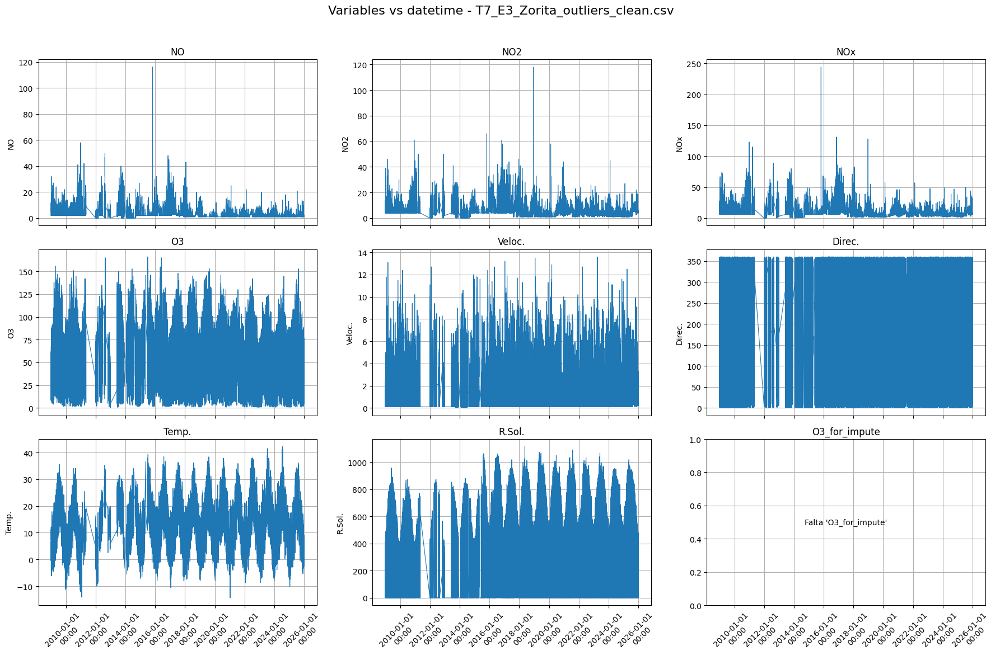

/var/folders/y_/8n8k4c3130sbkdjs9tb0_pv80000gp/T/ipykernel_1458/3301309580.py:72: UserWarning: Parsing dates in %Y-%m-%d %H:%M:%S format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  df[datetime_col] = pd.to_datetime(df[datetime_col], errors="coerce", dayfirst=True)


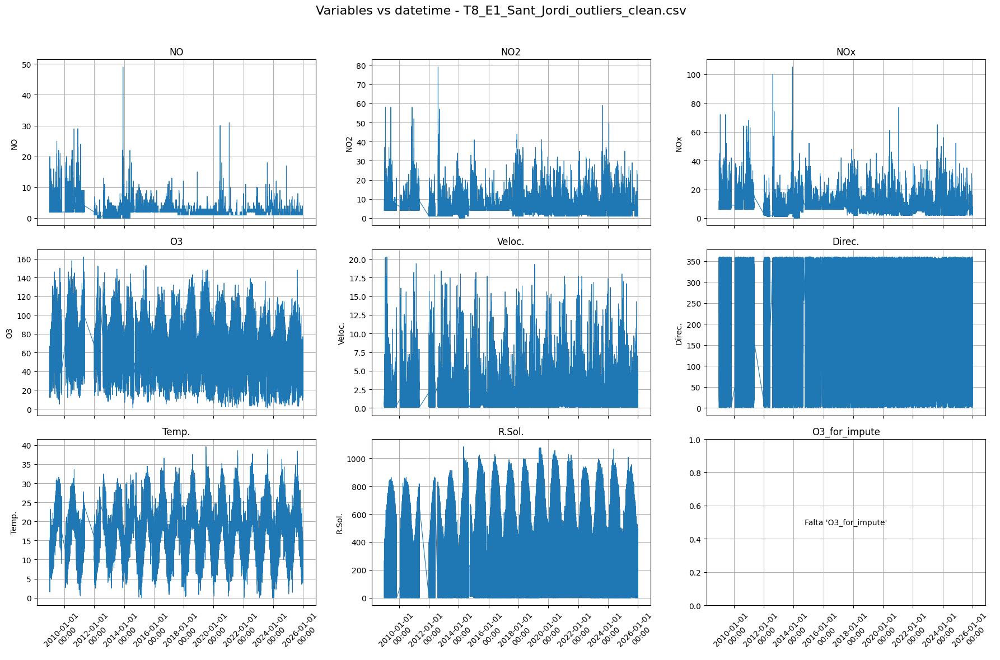

/var/folders/y_/8n8k4c3130sbkdjs9tb0_pv80000gp/T/ipykernel_1458/3301309580.py:72: UserWarning: Parsing dates in %Y-%m-%d %H:%M:%S format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  df[datetime_col] = pd.to_datetime(df[datetime_col], errors="coerce", dayfirst=True)


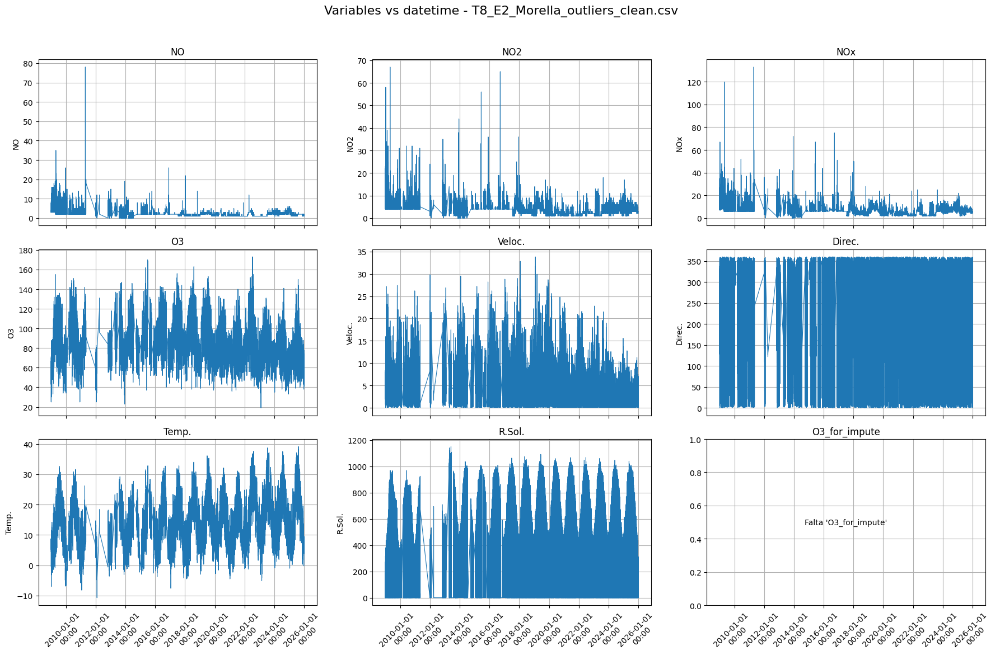

/var/folders/y_/8n8k4c3130sbkdjs9tb0_pv80000gp/T/ipykernel_1458/3301309580.py:72: UserWarning: Parsing dates in %Y-%m-%d %H:%M:%S format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  df[datetime_col] = pd.to_datetime(df[datetime_col], errors="coerce", dayfirst=True)


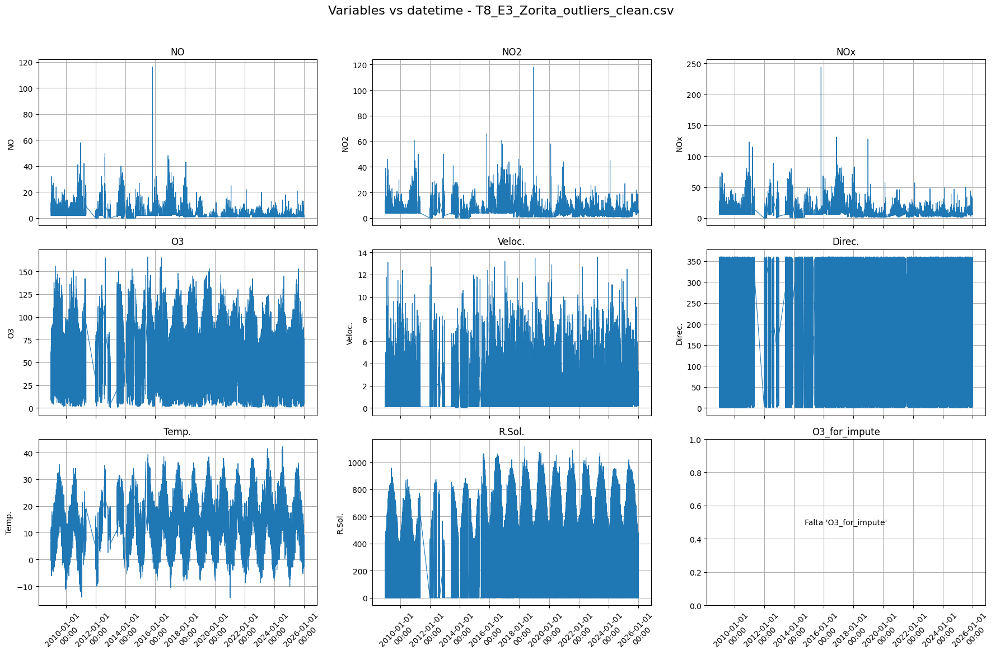

In [4]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# --------------------------------------------------
# Ruta base
# --------------------------------------------------
base_path = Path("/Volumes/copia seguridad1/enviar_benja/")

# --------------------------------------------------
# Archivos CSV que aparecen en la imagen
# --------------------------------------------------
csv_files = [
    "T1_E1_Alicante_outliers_clean.csv",
    "T1_E2_Elda_outliers_clean.csv",
    "T2_E1_Elche_outliers_clean.csv",
    "T2_E2_Elda_outliers_clean.csv",
    "T3_E1_Valencia_outliers_clean.csv",
    "T3_E2_Buñol_outliers_clean.csv",
    "T4_E1_Valencia_outliers_clean.csv",
    "T4_E2_Villar_Arzobispo_outliers_clean.csv",
    "T6_E1_Castellon_outliers_clean.csv",
    "T6_E2_Onda_outliers_clean.csv",
    "T7_E1_Sant_Jordi_outliers_clean.csv",
    "T7_E2_Coratxa_outliers_clean.csv",
    "T7_E3_Zorita_outliers_clean.csv",
    "T8_E1_Sant_Jordi_outliers_clean.csv",
    "T8_E2_Morella_outliers_clean.csv",
    "T8_E3_Zorita_outliers_clean.csv",
]

# --------------------------------------------------
# Variables a graficar
# --------------------------------------------------
variables = [
    "NO",
    "NO2",
    "NOx",
    "O3",
    "Veloc.",
    "Direc.",
    "Temp.",
    "R.Sol.",
    "O3_for_impute",
]

datetime_col = "datetime"

# --------------------------------------------------
# Configuración visual
# --------------------------------------------------
plt.rcParams["figure.figsize"] = (18, 12)
plt.rcParams["axes.grid"] = True

for file_name in csv_files:
    file_path = base_path / file_name

    if not file_path.exists():
        print(f"⚠️ No existe el archivo: {file_path}")
        continue

    # Lee el CSV intentando detectar automáticamente el separador
    df = pd.read_csv(file_path, sep=None, engine="python")
    df.columns = df.columns.str.strip()

    if datetime_col not in df.columns:
        print(f"⚠️ En {file_name} no existe la columna '{datetime_col}'")
        continue

    # Convierte datetime y ordena por fecha
    df[datetime_col] = pd.to_datetime(df[datetime_col], errors="coerce", dayfirst=True)
    df = df.dropna(subset=[datetime_col]).sort_values(datetime_col)

    # Crea figura con 9 subplots
    fig, axes = plt.subplots(3, 3, sharex=True)
    axes = axes.ravel()

    for i, var in enumerate(variables):
        ax = axes[i]

        if var in df.columns:
            ax.plot(df[datetime_col], df[var], linewidth=0.8)
            ax.set_title(var)
            ax.set_ylabel(var)
        else:
            ax.text(0.5, 0.5, f"Falta '{var}'", ha="center", va="center", transform=ax.transAxes)
            ax.set_title(var)

        ax.xaxis.set_major_locator(mdates.AutoDateLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d\n%H:%M"))
        ax.tick_params(axis="x", rotation=45)

    fig.suptitle(f"Variables vs datetime - {file_name}", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

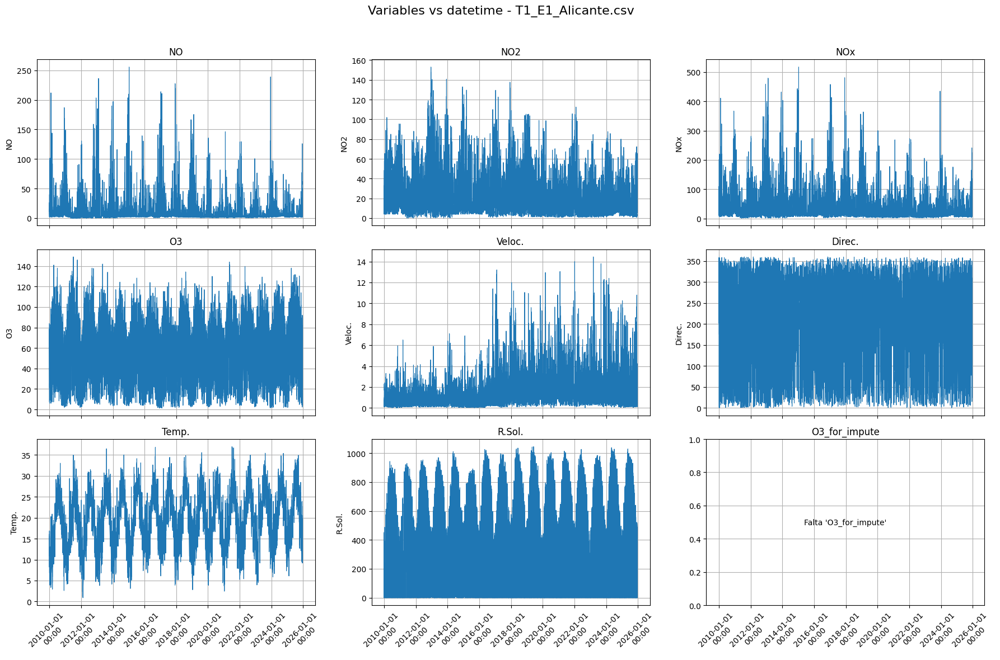

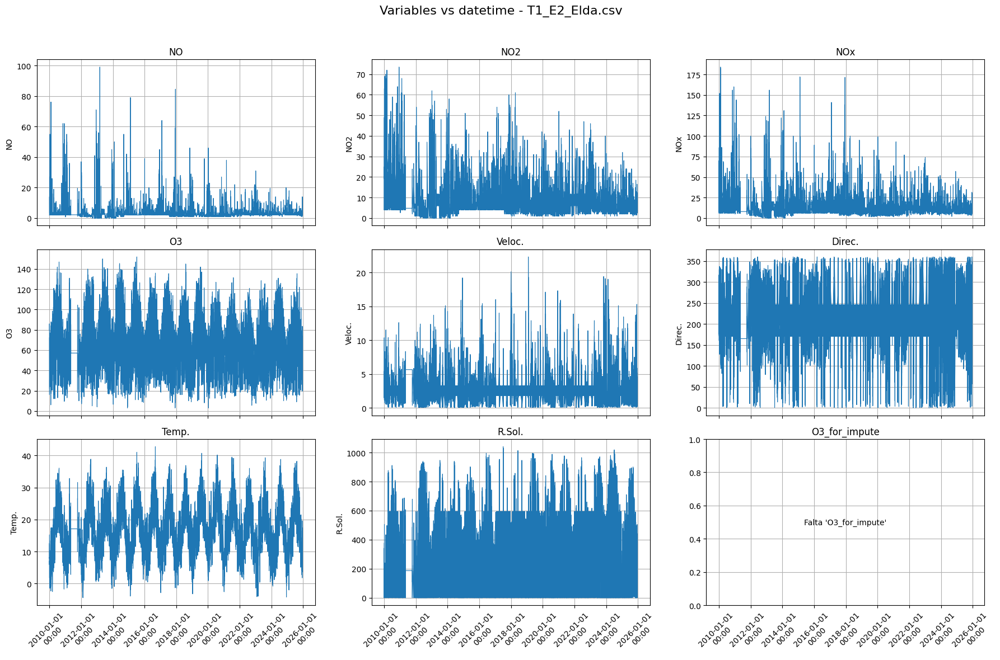

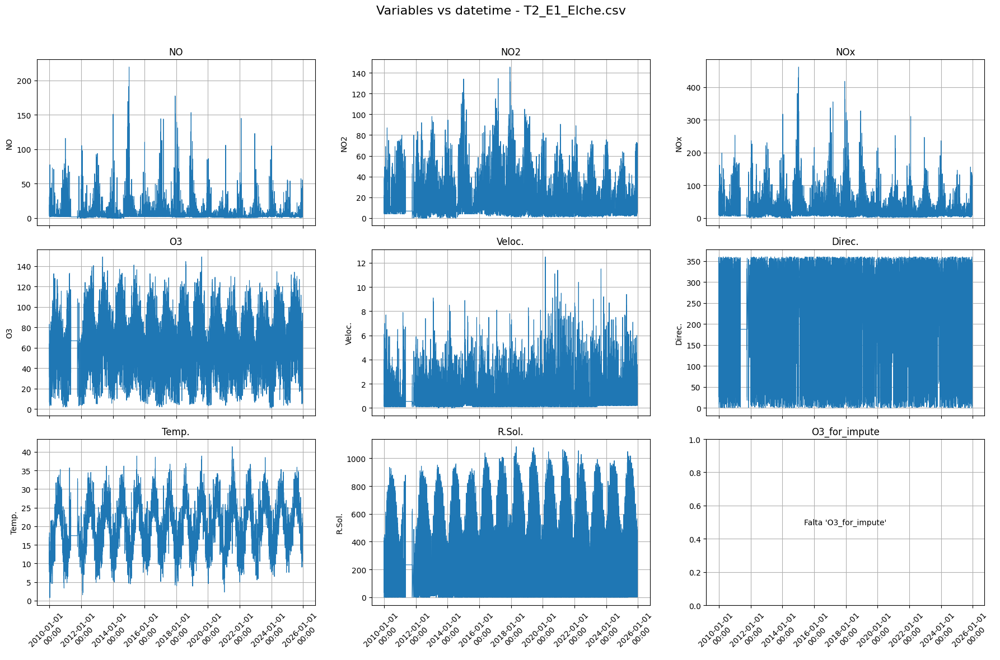

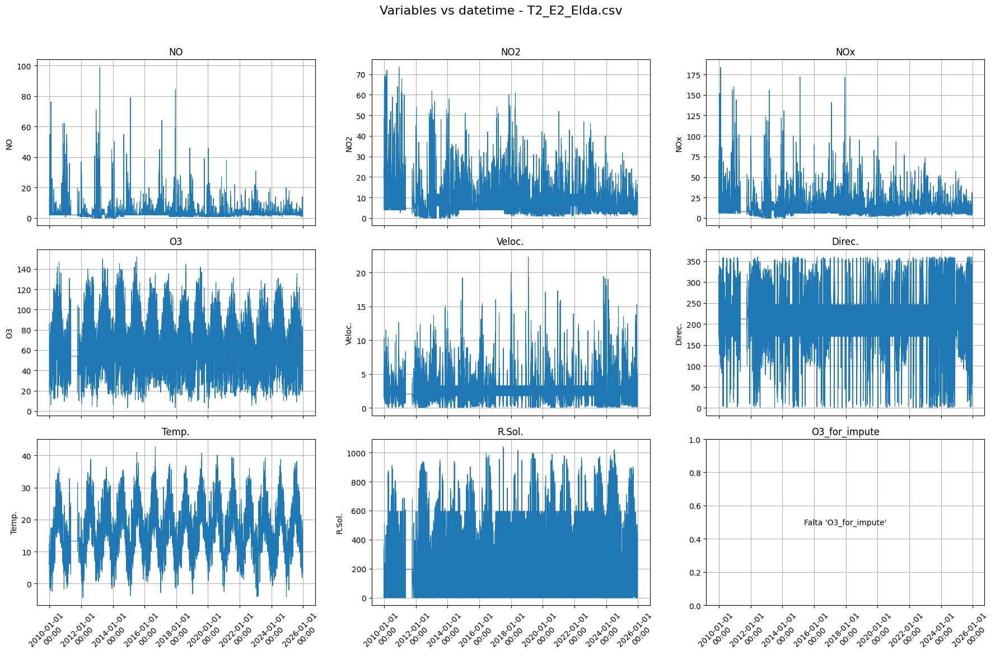

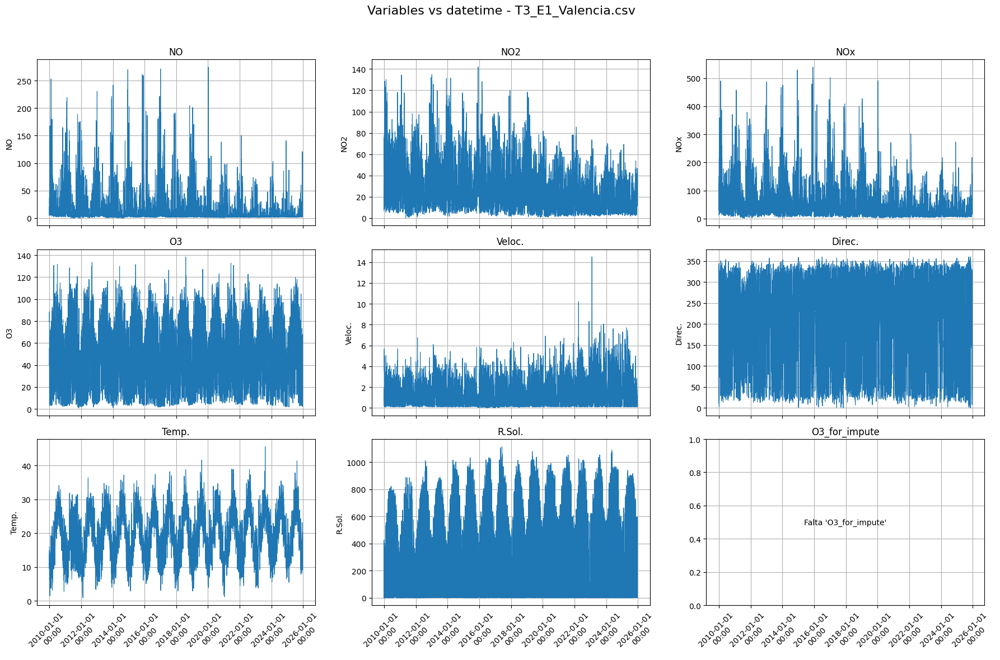

...

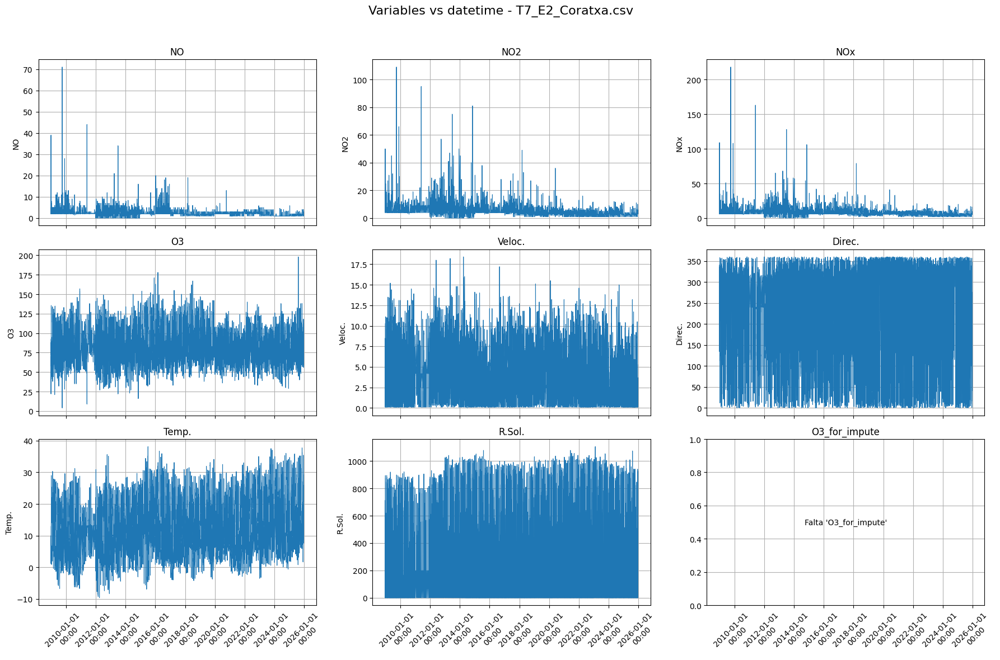

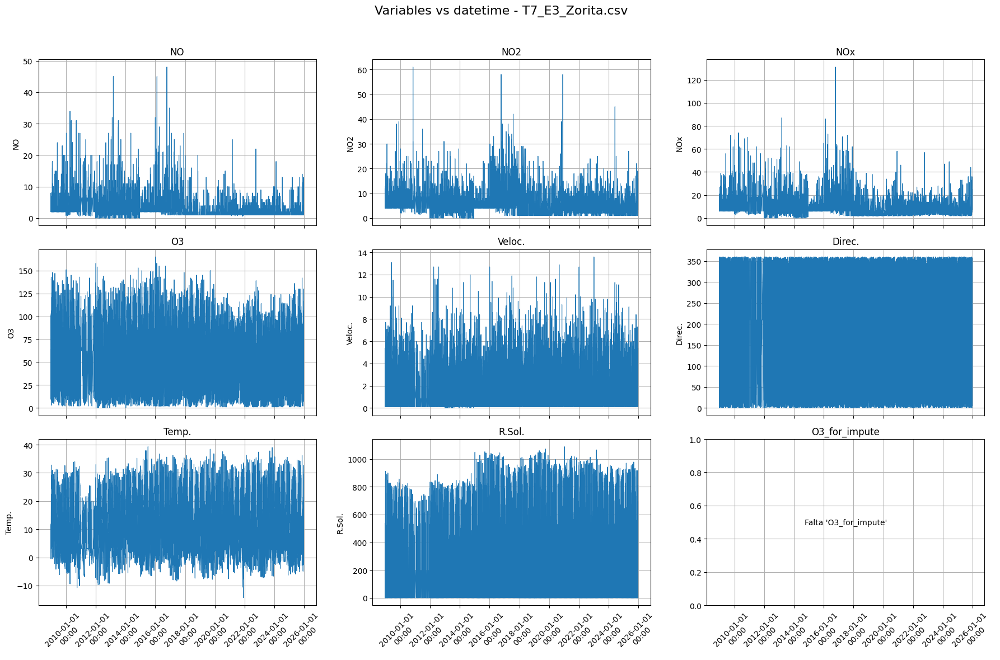

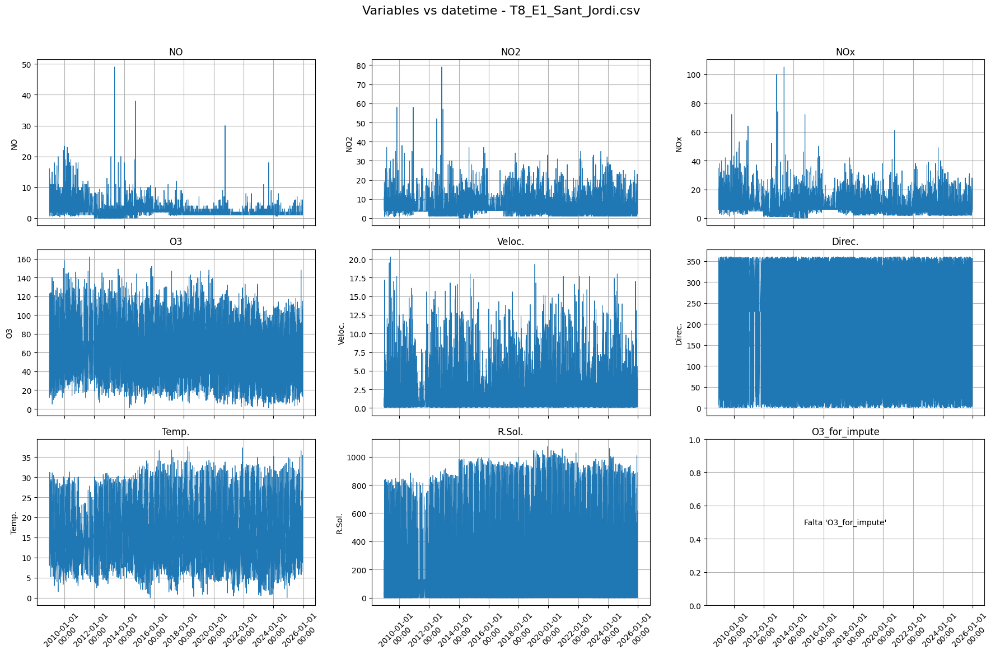

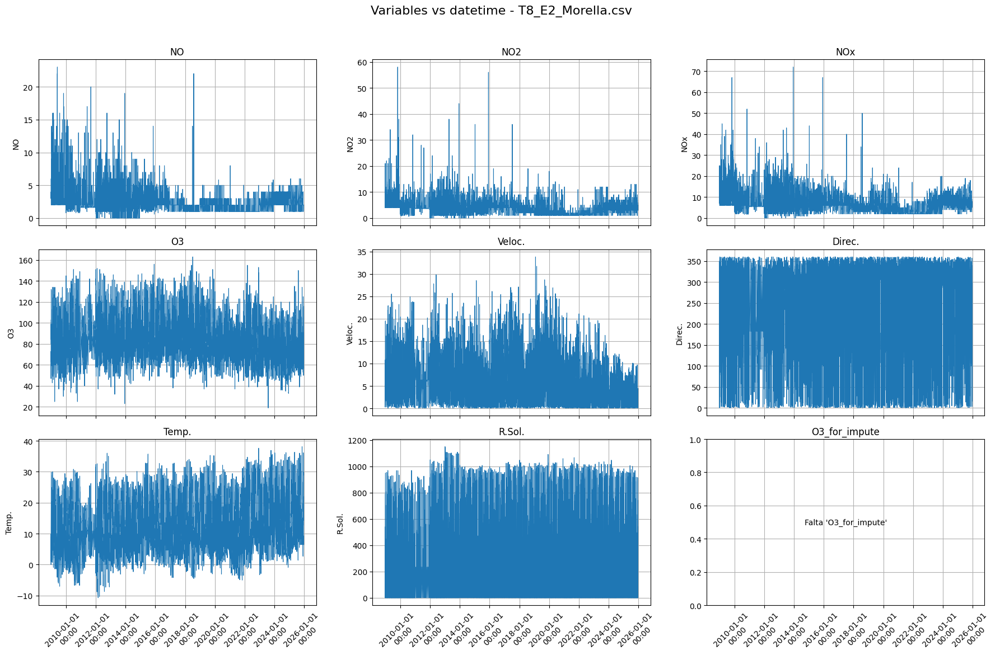

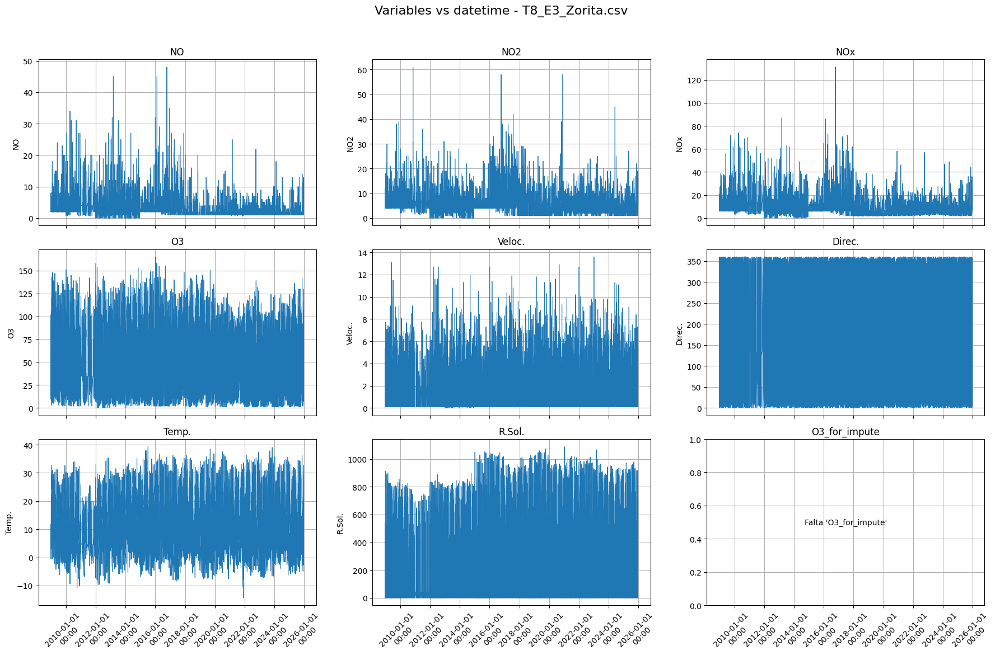

In [2]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# --------------------------------------------------
# Ruta base
# --------------------------------------------------
base_path = Path("/Volumes/copia seguridad1/enviar_benja/imputed_global/")

# --------------------------------------------------
# Archivos CSV que aparecen en la imagen
# --------------------------------------------------
csv_files = [
    "T1_E1_Alicante.csv",
    "T1_E2_Elda.csv",
    "T2_E1_Elche.csv",
    "T2_E2_Elda.csv",
    "T3_E1_Valencia.csv",
    "T3_E2_Buñol.csv",
    "T4_E1_Valencia.csv",
    "T4_E2_Villar_Arzobispo.csv",
    "T6_E1_Castellon.csv",
    "T6_E2_Onda.csv",
    "T7_E1_Sant_Jordi.csv",
    "T7_E2_Coratxa.csv",
    "T7_E3_Zorita.csv",
    "T8_E1_Sant_Jordi.csv",
    "T8_E2_Morella.csv",
    "T8_E3_Zorita.csv",
]

# --------------------------------------------------
# Variables a graficar
# --------------------------------------------------
variables = [
    "NO",
    "NO2",
    "NOx",
    "O3",
    "Veloc.",
    "Direc.",
    "Temp.",
    "R.Sol.",
    "O3_for_impute",
]

datetime_col = "datetime"

# --------------------------------------------------
# Configuración visual
# --------------------------------------------------
plt.rcParams["figure.figsize"] = (18, 12)
plt.rcParams["axes.grid"] = True

for file_name in csv_files:
    file_path = base_path / file_name

    if not file_path.exists():
        print(f"⚠️ No existe el archivo: {file_path}")
        continue

    # Lee el CSV intentando detectar automáticamente el separador
    df = pd.read_csv(file_path, sep=None, engine="python")
    df.columns = df.columns.str.strip()

    if datetime_col not in df.columns:
        print(f"⚠️ En {file_name} no existe la columna '{datetime_col}'")
        continue

    # Convierte datetime y ordena por fecha
    df[datetime_col] = pd.to_datetime(df[datetime_col], errors="coerce", dayfirst=True)
    df = df.dropna(subset=[datetime_col]).sort_values(datetime_col)

    # Crea figura con 9 subplots
    fig, axes = plt.subplots(3, 3, sharex=True)
    axes = axes.ravel()

    for i, var in enumerate(variables):
        ax = axes[i]

        if var in df.columns:
            ax.plot(df[datetime_col], df[var], linewidth=0.8)
            ax.set_title(var)
            ax.set_ylabel(var)
        else:
            ax.text(0.5, 0.5, f"Falta '{var}'", ha="center", va="center", transform=ax.transAxes)
            ax.set_title(var)

        ax.xaxis.set_major_locator(mdates.AutoDateLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d\n%H:%M"))
        ax.tick_params(axis="x", rotation=45)

    fig.suptitle(f"Variables vs datetime - {file_name}", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# Imputar quitando NANs

In [ ]:
import pandas as pd
from pathlib import Path

# --------------------------------------------------
# Ruta del archivo (elige uno)
# --------------------------------------------------
file_path = Path("/Volumes/copia seguridad1/enviar_benja/T8_E2_Morella_outliers.csv")

# --------------------------------------------------
# Leer CSV
# --------------------------------------------------
df = pd.read_csv(file_path, sep=None, engine="python")

print("Filas originales:", len(df))

# --------------------------------------------------
# Eliminar filas con cualquier NaN
# --------------------------------------------------
df_clean = df.dropna()

print("Filas después de limpiar:", len(df_clean))

# --------------------------------------------------
# Guardar nuevo archivo
# --------------------------------------------------
output_path = file_path.with_name(file_path.stem + "_clean.csv")
df_clean.to_csv(output_path, index=False)

print("Archivo guardado en:", output_path)

# Imputar por la media

In [ ]:
import pandas as pd
from pathlib import Path

# Ruta del archivo
file_path = Path("/Volumes/copia seguridad1/enviar_benja/T8_E2_Morella_outliers.csv")

# Leer CSV
df = pd.read_csv(file_path, sep=None, engine="python")

print("NaNs antes:\n", df.isna().sum())

# Imputar la media solo en columnas numéricas
num_cols = df.select_dtypes(include="number").columns
df[num_cols] = df[num_cols].fillna(df[num_cols].mean())

print("\nNaNs después:\n", df.isna().sum())

# Guardar el archivo resultante
output_path = file_path.with_name(file_path.stem + "_imputado_media.csv")
df.to_csv(output_path, index=False)

print(f"\nArchivo guardado en: {output_path}")

In [3]:
import pandas as pd
from pathlib import Path

# --------------------------------------------------
# Ruta base
# --------------------------------------------------
base_path = Path("/Volumes/copia seguridad1/enviar_benja/")

# --------------------------------------------------
# Archivos CSV que aparecen en la imagen
# --------------------------------------------------
csv_files = [
    "T1_E1_Alicante_outliers.csv",
    "T1_E2_Elda_outliers.csv",
    "T2_E1_Elche_outliers.csv",
    "T2_E2_Elda_outliers.csv",
    "T3_E1_Valencia_outliers.csv",
    "T3_E2_Buñol_outliers.csv",
    "T4_E1_Valencia_outliers.csv",
    "T4_E2_Villar_Arzobispo_outliers.csv",
    "T6_E1_Castellon_outliers.csv",
    "T6_E2_Onda_outliers.csv",
    "T7_E1_Sant_Jordi_outliers.csv",
    "T7_E2_Coratxa_outliers.csv",
    "T7_E3_Zorita_outliers.csv",
    "T8_E1_Sant_Jordi_outliers.csv",
    "T8_E2_Morella_outliers.csv",
    "T8_E3_Zorita_outliers.csv",
]

# --------------------------------------------------
# Eliminar filas con NaN en cada archivo
# --------------------------------------------------
for file_name in csv_files:
    file_path = base_path / file_name

    if not file_path.exists():
        print(f"⚠️ No existe el archivo: {file_path}")
        continue

    df = pd.read_csv(file_path, sep=None, engine="python")

    filas_originales = len(df)
    df_clean = df.dropna()
    filas_finales = len(df_clean)

    output_path = file_path.with_name(file_path.stem + "_clean.csv")
    df_clean.to_csv(output_path, index=False)

    print(f"✅ {file_name}: {filas_originales} -> {filas_finales} filas")
    print(f"   Guardado en: {output_path}")

✅ T1_E1_Alicante_outliers.csv: 140256 -> 138250 filas
   Guardado en: /Volumes/copia seguridad1/enviar_benja/T1_E1_Alicante_outliers_clean.csv
✅ T1_E2_Elda_outliers.csv: 140256 -> 56160 filas
   Guardado en: /Volumes/copia seguridad1/enviar_benja/T1_E2_Elda_outliers_clean.csv
✅ T2_E1_Elche_outliers.csv: 140256 -> 127239 filas
   Guardado en: /Volumes/copia seguridad1/enviar_benja/T2_E1_Elche_outliers_clean.csv
✅ T2_E2_Elda_outliers.csv: 140256 -> 56160 filas
   Guardado en: /Volumes/copia seguridad1/enviar_benja/T2_E2_Elda_outliers_clean.csv
✅ T3_E1_Valencia_outliers.csv: 140256 -> 128949 filas
   Guardado en: /Volumes/copia seguridad1/enviar_benja/T3_E1_Valencia_outliers_clean.csv
✅ T3_E2_Buñol_outliers.csv: 118104 -> 108174 filas
   Guardado en: /Volumes/copia seguridad1/enviar_benja/T3_E2_Buñol_outliers_clean.csv
✅ T4_E1_Valencia_outliers.csv: 140256 -> 128949 filas
   Guardado en: /Volumes/copia seguridad1/enviar_benja/T4_E1_Valencia_outliers_clean.csv
✅ T4_E2_Villar_Arzobispo_outl


REVISIÓN DE: T1_E1_Alicante_outliers

Dimensiones:
(138250, 13)

Primeras filas:
              datetime    NO  NO2   NOx    O3  Veloc.  Direc.  Temp.  R.Sol.  \
0  2010-01-01 00:00:00  11.0  4.5  19.0  78.5     1.7   311.0   11.6     0.0   
1  2010-01-01 01:00:00  11.0  4.5  19.5  76.0     1.8   301.0   11.1     0.0   
2  2010-01-01 02:00:00  11.0  5.5  21.5  79.5     1.7   309.0   10.7     0.0   
3  2010-01-01 03:00:00  12.0  4.0  21.5  83.0     1.9   318.0   10.6     0.0   
4  2010-01-01 04:00:00  13.0  5.0  23.5  79.0     1.2   314.0   10.5     0.0   

     Estacion    Transecto  Dist.  Angulo  
0  Estacion 1  Transecto 1    0.0   128.0  
1  Estacion 1  Transecto 1    0.0   128.0  
2  Estacion 1  Transecto 1    0.0   128.0  
3  Estacion 1  Transecto 1    0.0   128.0  
4  Estacion 1  Transecto 1    0.0   128.0  

Tipos de datos:
datetime      object
NO           float64
NO2          float64
NOx          float64
O3           float64
Veloc.       float64
Direc.       float64
Temp.    

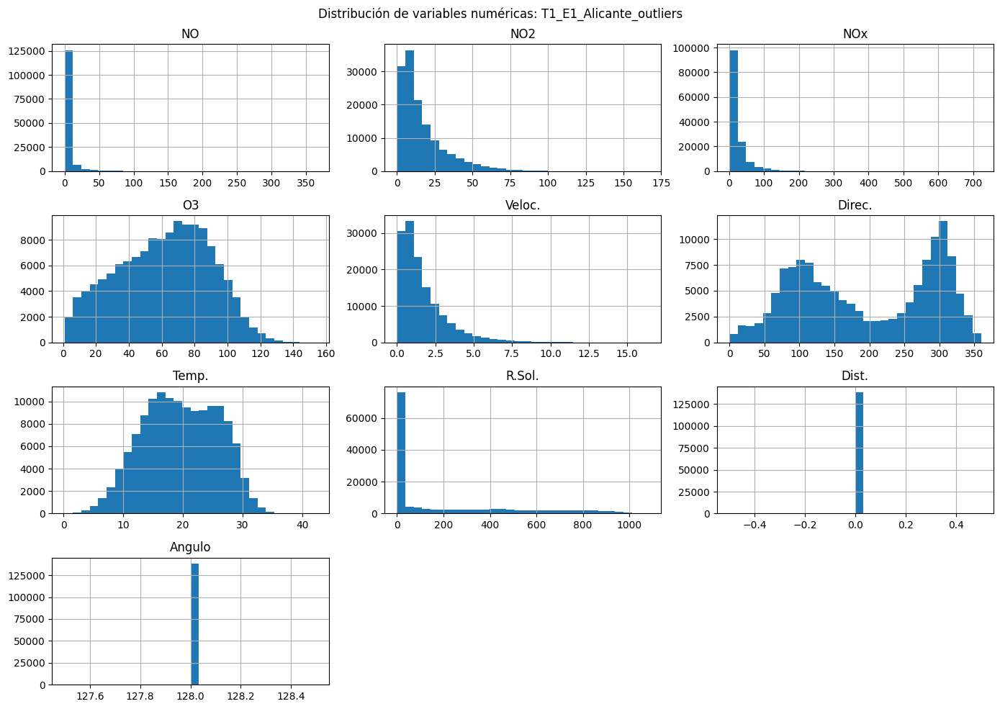

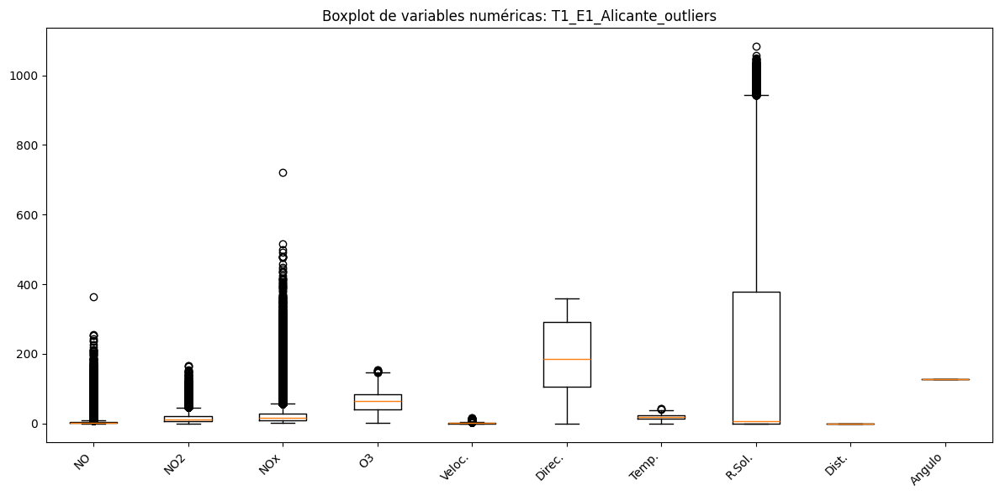


REVISIÓN DE: T1_E2_Elda_outliers

Dimensiones:
(56160, 13)

Primeras filas:
              datetime    NO   NO2   NOx    O3  Veloc.  Direc.  Temp.  R.Sol.  \
0  2010-03-22 16:00:00   5.0  10.0  16.0  84.5     4.6   344.0  20.65   496.0   
1  2010-03-22 17:00:00   2.0   7.0  10.0  86.0     4.2   332.0  20.45   324.0   
2  2010-03-22 18:00:00   2.0  18.0  21.0  73.0     2.4   337.0  18.15   101.0   
3  2010-03-22 19:00:00   2.0  31.0  34.0  55.0     1.0   308.0  14.90     0.0   
4  2010-03-22 21:00:00  11.0  57.0  74.0  24.5     1.1    29.0  11.85     0.0   

     Estacion    Transecto    Dist.  Angulo  
0  Estacion 2  Transecto 1  28900.0   109.6  
1  Estacion 2  Transecto 1  28900.0   109.6  
2  Estacion 2  Transecto 1  28900.0   109.6  
3  Estacion 2  Transecto 1  28900.0   109.6  
4  Estacion 2  Transecto 1  28900.0   109.6  

Tipos de datos:
datetime      object
NO           float64
NO2          float64
NOx          float64
O3           float64
Veloc.       float64
Direc.       floa

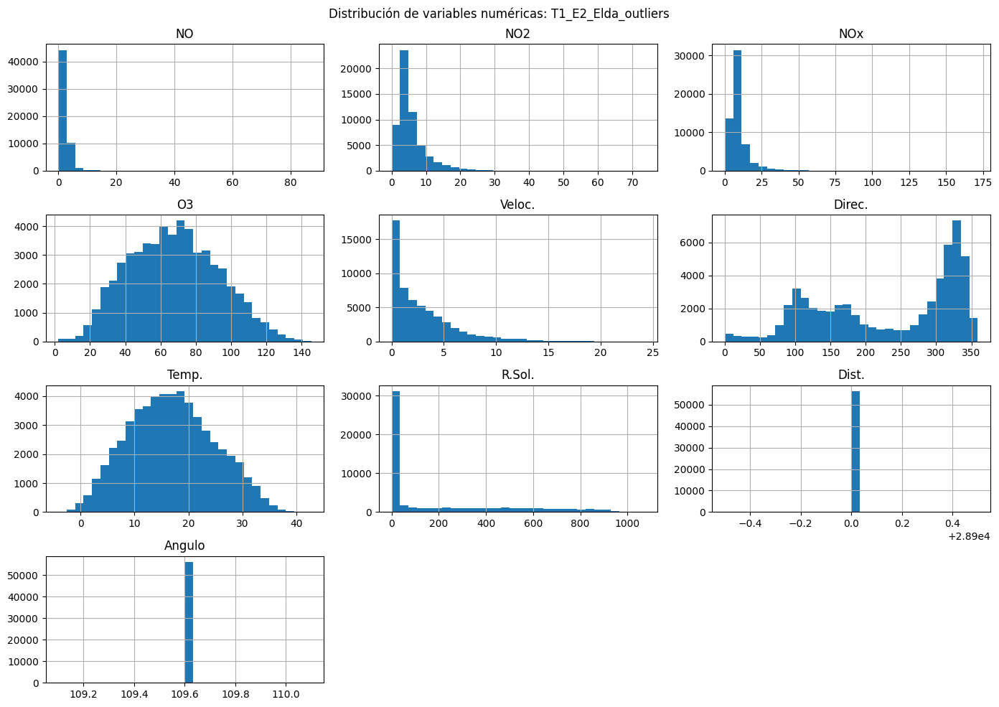

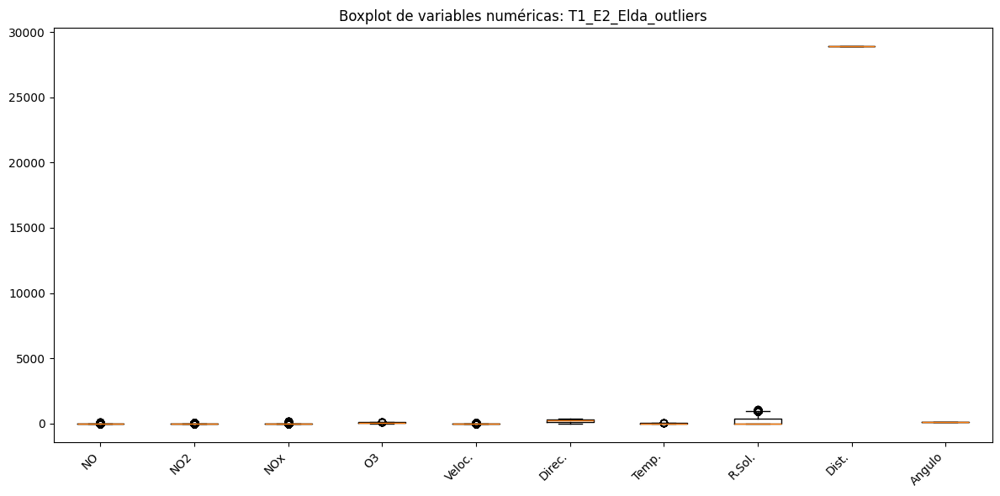


REVISIÓN DE: T2_E1_Elche_outliers

Dimensiones:
(127239, 13)

Primeras filas:
              datetime   NO  NO2   NOx    O3  Veloc.  Direc.  Temp.  R.Sol.  \
0  2010-01-01 00:00:00  6.0  5.0  14.0  79.0     4.0   262.0   11.8     0.0   
1  2010-01-01 01:00:00  5.0  5.0  12.0  78.5     2.6   248.0   10.8     0.0   
2  2010-01-01 02:00:00  4.0  7.0  13.0  83.0     1.7   247.0   10.8     0.0   
3  2010-01-01 03:00:00  3.0  5.0  10.0  83.0     1.4   254.0   10.7     0.0   
4  2010-01-01 04:00:00  3.0  5.0  10.0  80.0     0.7   248.0    9.6     0.0   

     Estacion    Transecto    Dist.  Angulo  
0  Estacion 1  Transecto 2  11500.0   132.6  
1  Estacion 1  Transecto 2  11500.0   132.6  
2  Estacion 1  Transecto 2  11500.0   132.6  
3  Estacion 1  Transecto 2  11500.0   132.6  
4  Estacion 1  Transecto 2  11500.0   132.6  

Tipos de datos:
datetime      object
NO           float64
NO2          float64
NOx          float64
O3           float64
Veloc.       float64
Direc.       float64
Temp. 

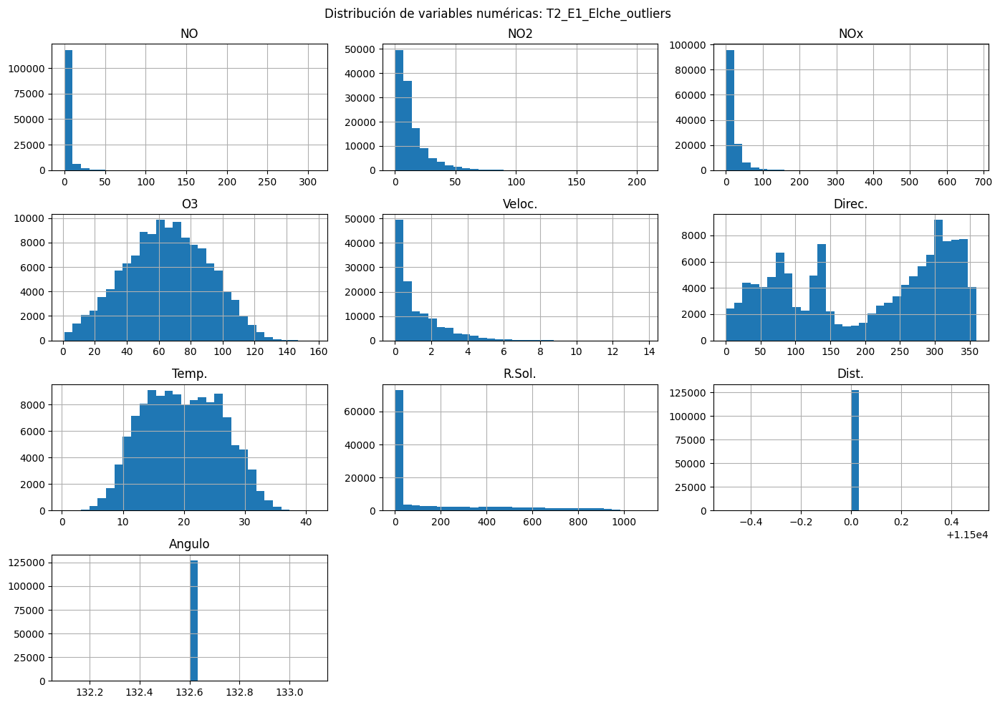

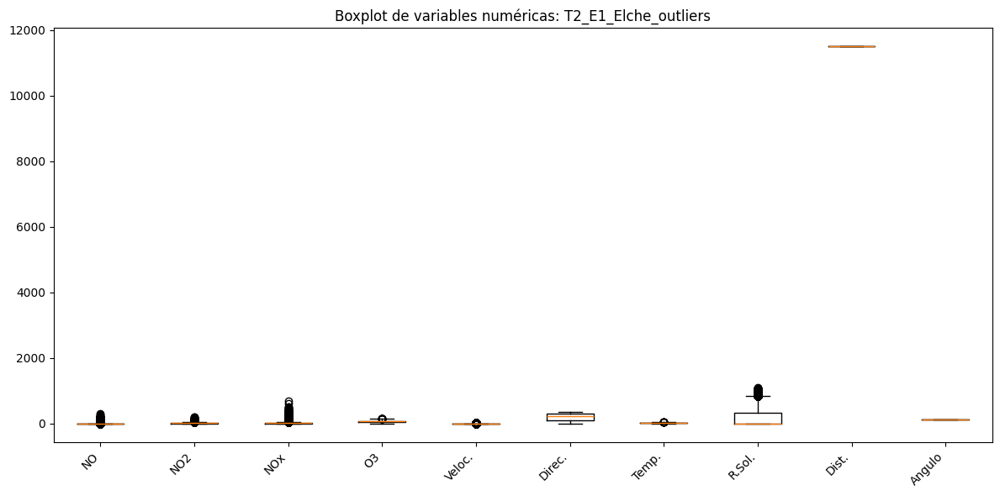


REVISIÓN DE: T2_E2_Elda_outliers

Dimensiones:
(56160, 13)

Primeras filas:
              datetime    NO   NO2   NOx    O3  Veloc.  Direc.  Temp.  R.Sol.  \
0  2010-03-22 16:00:00   5.0  10.0  16.0  84.5     4.6   344.0  20.65   496.0   
1  2010-03-22 17:00:00   2.0   7.0  10.0  86.0     4.2   332.0  20.45   324.0   
2  2010-03-22 18:00:00   2.0  18.0  21.0  73.0     2.4   337.0  18.15   101.0   
3  2010-03-22 19:00:00   2.0  31.0  34.0  55.0     1.0   308.0  14.90     0.0   
4  2010-03-22 21:00:00  11.0  57.0  74.0  24.5     1.1    29.0  11.85     0.0   

     Estacion    Transecto    Dist.  Angulo  
0  Estacion 2  Transecto 2  23300.0   155.8  
1  Estacion 2  Transecto 2  23300.0   155.8  
2  Estacion 2  Transecto 2  23300.0   155.8  
3  Estacion 2  Transecto 2  23300.0   155.8  
4  Estacion 2  Transecto 2  23300.0   155.8  

Tipos de datos:
datetime      object
NO           float64
NO2          float64
NOx          float64
O3           float64
Veloc.       float64
Direc.       floa

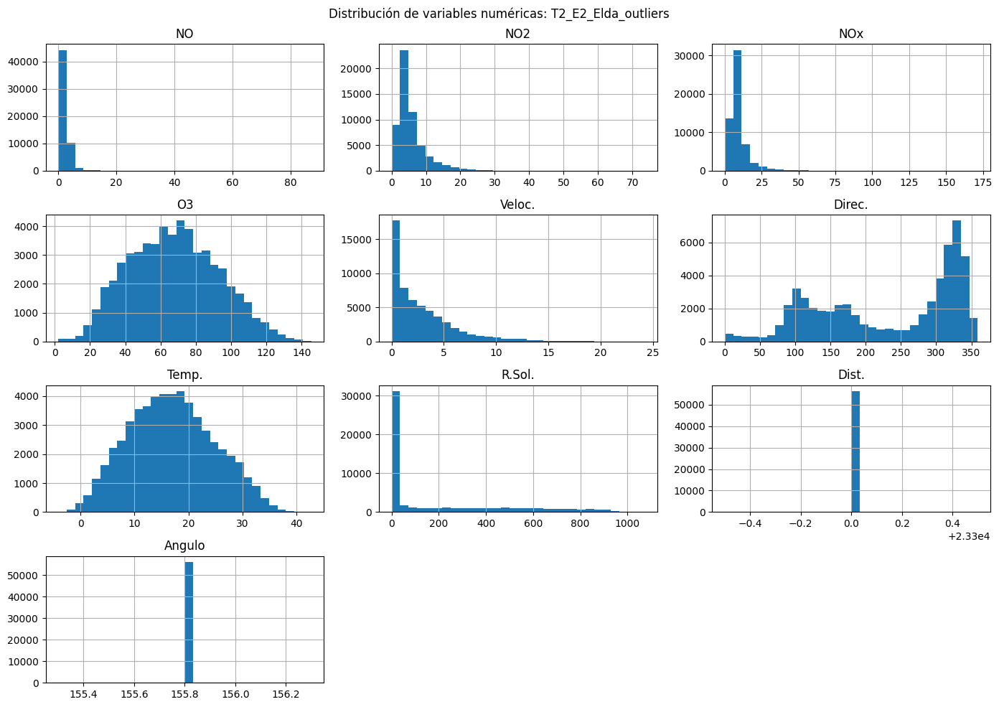

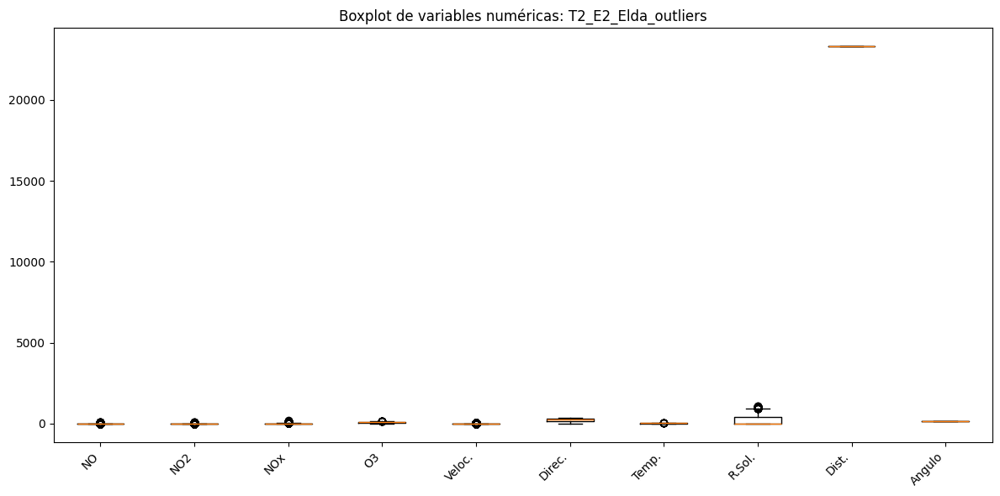


REVISIÓN DE: T3_E1_Valencia_outliers

Dimensiones:
(128949, 13)

Primeras filas:
              datetime        NO       NO2        NOx         O3    Veloc.  \
0  2010-01-01 00:00:00  6.000000  8.285714  16.714286  79.000000  3.533333   
1  2010-01-01 01:00:00  5.857143  9.428571  18.142857  83.428571  4.633333   
2  2010-01-01 02:00:00  5.285714  7.142857  14.714286  88.428571  4.833333   
3  2010-01-01 03:00:00  4.571429  7.428571  13.714286  83.428571  3.866667   
4  2010-01-01 04:00:00  5.285714  6.857143  14.571429  81.857143  4.100000   

       Direc.  Temp.  R.Sol.    Estacion    Transecto  Dist.  Angulo  
0  261.333333  11.25     0.0  Estacion 1  Transecto 3    0.0    96.2  
1  275.000000  11.00     0.0  Estacion 1  Transecto 3    0.0    96.2  
2  270.666667  10.80     0.0  Estacion 1  Transecto 3    0.0    96.2  
3  273.000000  10.60     0.0  Estacion 1  Transecto 3    0.0    96.2  
4  274.000000  10.50     0.0  Estacion 1  Transecto 3    0.0    96.2  

Tipos de datos:
dateti

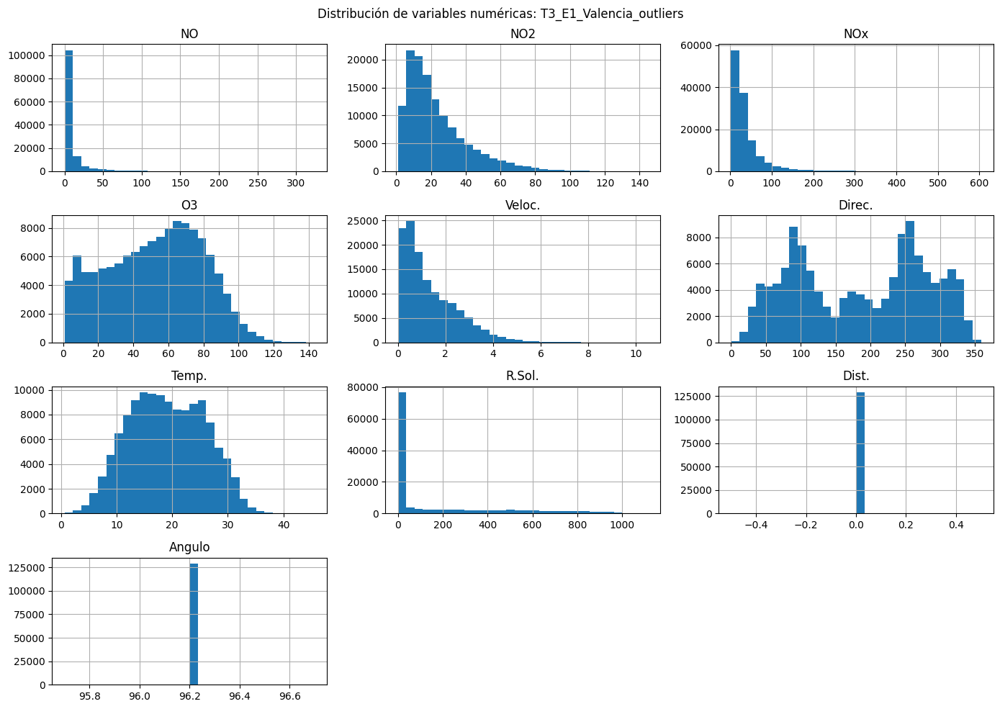

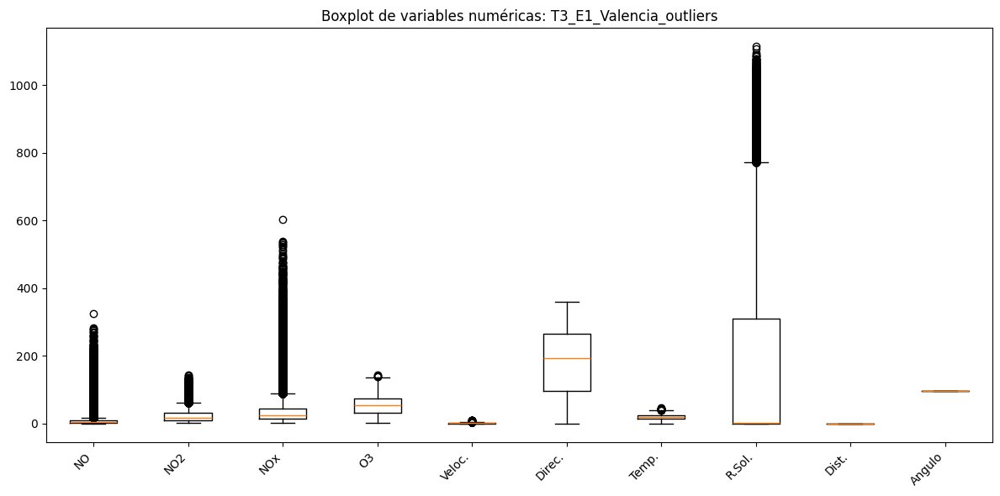


REVISIÓN DE: T3_E2_Buñol_outliers

Dimensiones:
(108174, 13)

Primeras filas:
              datetime   NO   NO2   NOx    O3  Veloc.  Direc.  Temp.  R.Sol.  \
0  2025-12-31 23:00:00  2.0   6.0   8.0  23.0     0.1   261.0    6.0     0.0   
1  2025-12-31 22:00:00  2.0   7.0  10.0  21.0     0.1   258.0    5.3     0.0   
2  2025-12-31 21:00:00  3.0  16.0  21.0  12.0     0.1   258.0    5.0     0.0   
3  2025-12-31 20:00:00  5.0  20.0  28.0   8.0     0.1   255.0    5.4     0.0   
4  2025-12-31 19:00:00  4.0  18.0  25.0   9.0     0.1   273.0    6.1     0.0   

     Estacion    Transecto  Dist.  Angulo  
0  Estacion 2  Transecto 3  34900      81  
1  Estacion 2  Transecto 3  34900      81  
2  Estacion 2  Transecto 3  34900      81  
3  Estacion 2  Transecto 3  34900      81  
4  Estacion 2  Transecto 3  34900      81  

Tipos de datos:
datetime      object
NO           float64
NO2          float64
NOx          float64
O3           float64
Veloc.       float64
Direc.       float64
Temp.       

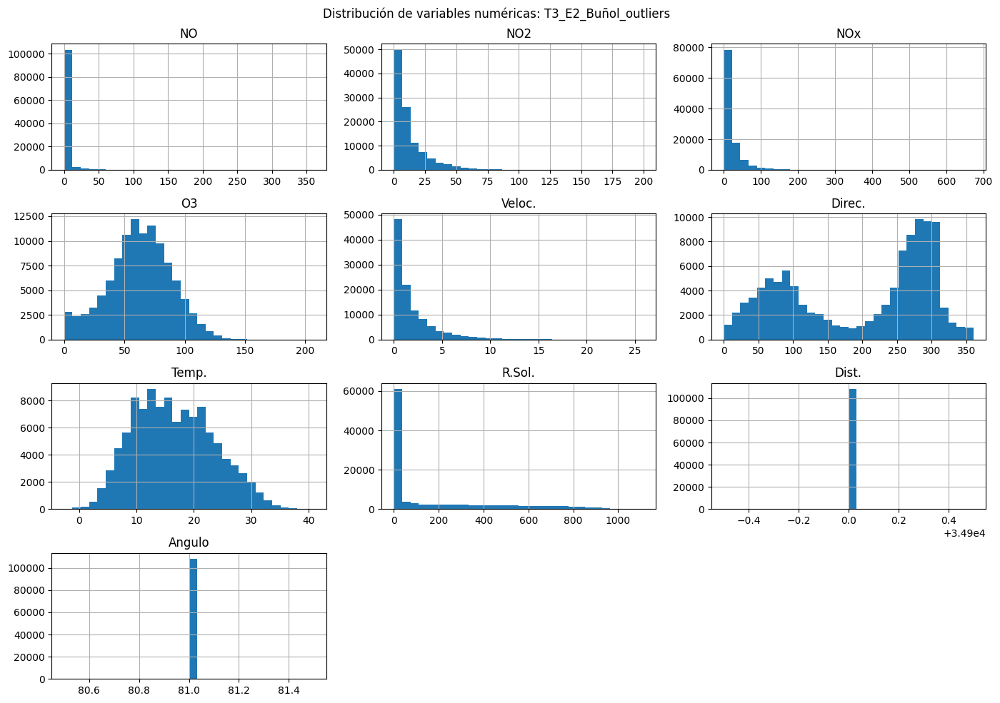

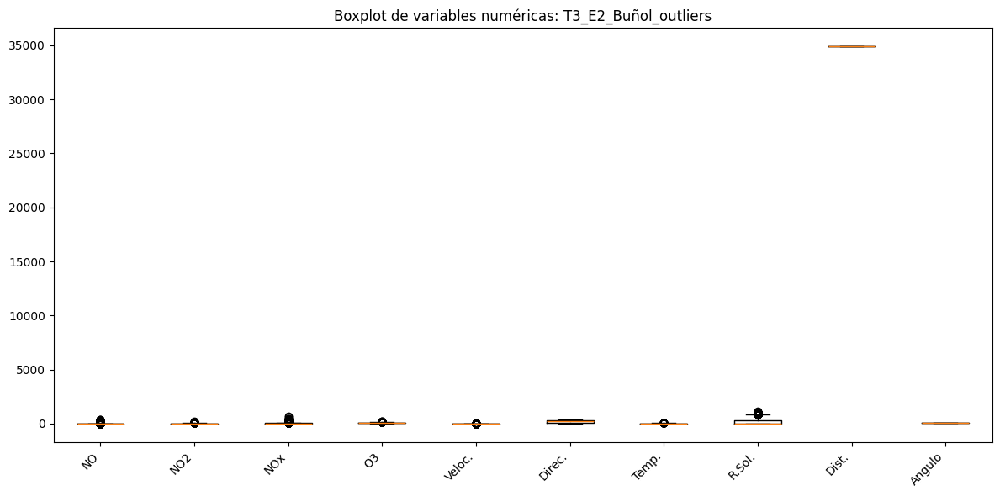


REVISIÓN DE: T4_E1_Valencia_outliers

Dimensiones:
(128949, 13)

Primeras filas:
              datetime        NO       NO2        NOx         O3    Veloc.  \
0  2010-01-01 00:00:00  6.000000  8.285714  16.714286  79.000000  3.533333   
1  2010-01-01 01:00:00  5.857143  9.428571  18.142857  83.428571  4.633333   
2  2010-01-01 02:00:00  5.285714  7.142857  14.714286  88.428571  4.833333   
3  2010-01-01 03:00:00  4.571429  7.428571  13.714286  83.428571  3.866667   
4  2010-01-01 04:00:00  5.285714  6.857143  14.571429  81.857143  4.100000   

       Direc.  Temp.  R.Sol.    Estacion    Transecto  Dist.  Angulo  
0  261.333333  11.25     0.0  Estacion 1  Transecto 4    0.0    96.2  
1  275.000000  11.00     0.0  Estacion 1  Transecto 4    0.0    96.2  
2  270.666667  10.80     0.0  Estacion 1  Transecto 4    0.0    96.2  
3  273.000000  10.60     0.0  Estacion 1  Transecto 4    0.0    96.2  
4  274.000000  10.50     0.0  Estacion 1  Transecto 4    0.0    96.2  

Tipos de datos:
dateti

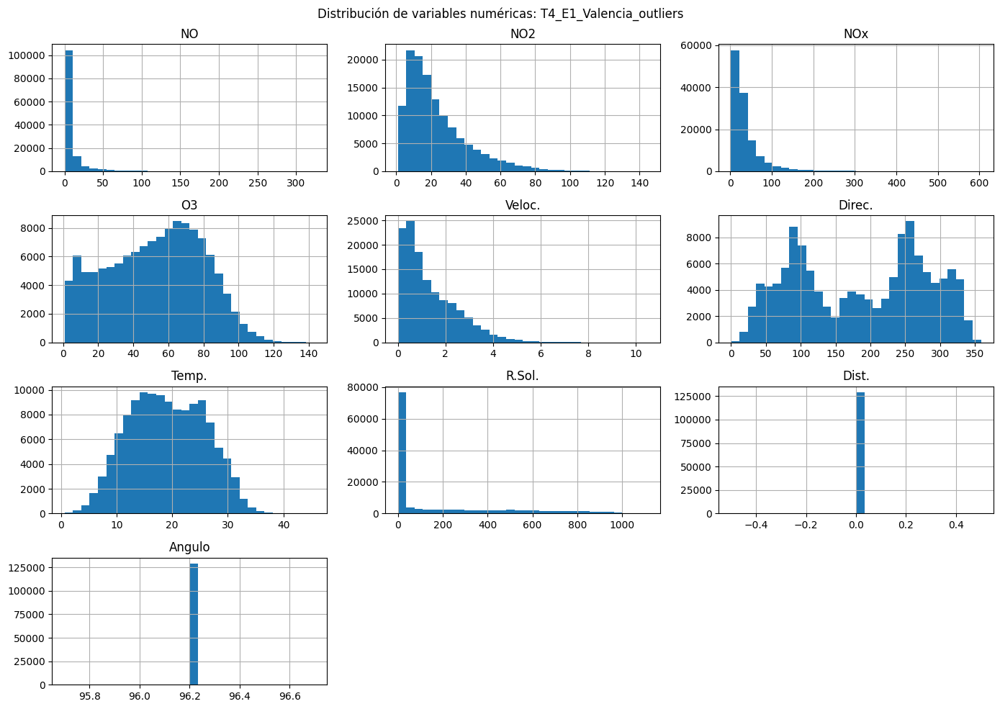

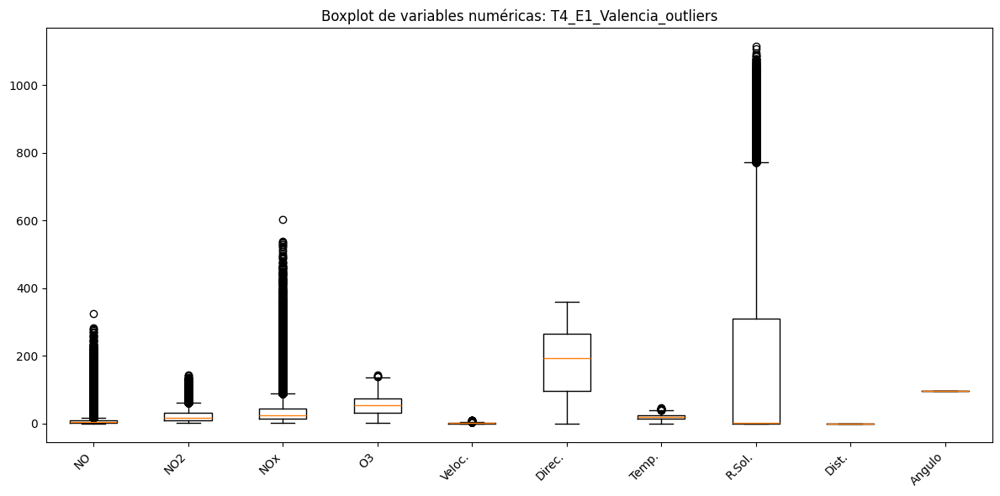


REVISIÓN DE: T4_E2_Villar_Arzobispo_outliers

Dimensiones:
(119163, 13)

Primeras filas:
              datetime   NO   NO2   NOx    O3  Veloc.  Direc.  Temp.  R.Sol.  \
0  2025-12-31 23:00:00  1.0   6.0   8.0  21.0     0.1   144.0    5.0     0.0   
1  2025-12-31 22:00:00  1.0   7.0   9.0  31.0     0.2   149.0    5.4     0.0   
2  2025-12-31 21:00:00  1.0   8.0  10.0  30.0     1.2    12.0    5.4     0.0   
3  2025-12-31 20:00:00  2.0   9.0  11.0  34.0     1.8    24.0    5.5     0.0   
4  2025-12-31 19:00:00  2.0  10.0  12.0  34.0     1.5    21.0    6.0     0.0   

     Estacion    Transecto  Dist.  Angulo  
0  Estacion 2  Transecto 4  47300   123.9  
1  Estacion 2  Transecto 4  47300   123.9  
2  Estacion 2  Transecto 4  47300   123.9  
3  Estacion 2  Transecto 4  47300   123.9  
4  Estacion 2  Transecto 4  47300   123.9  

Tipos de datos:
datetime      object
NO           float64
NO2          float64
NOx          float64
O3           float64
Veloc.       float64
Direc.       float64
T

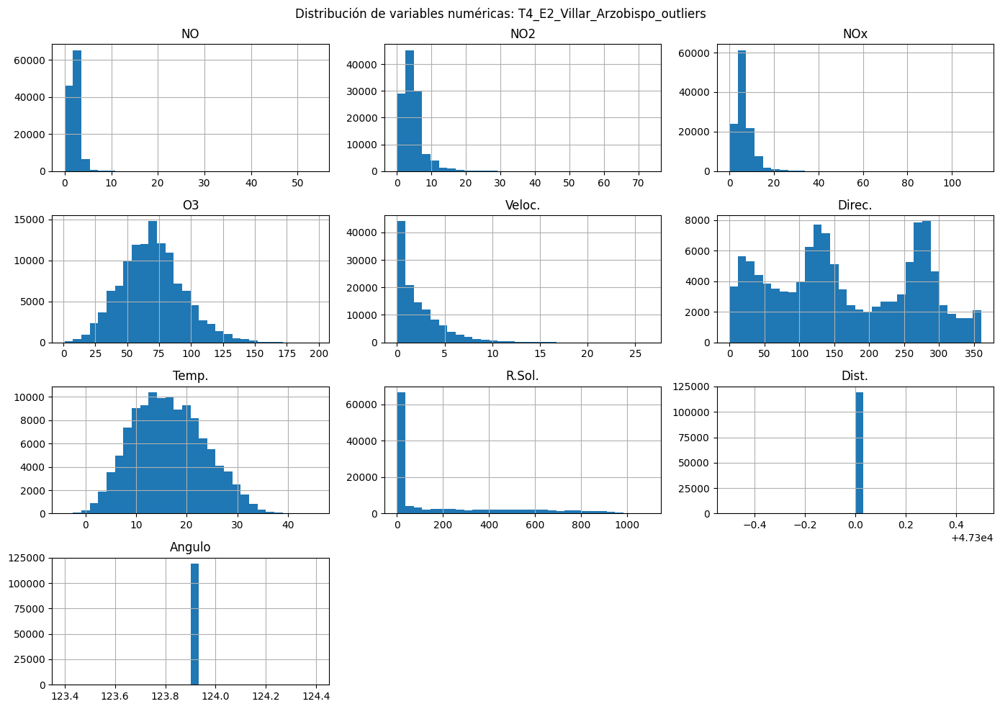

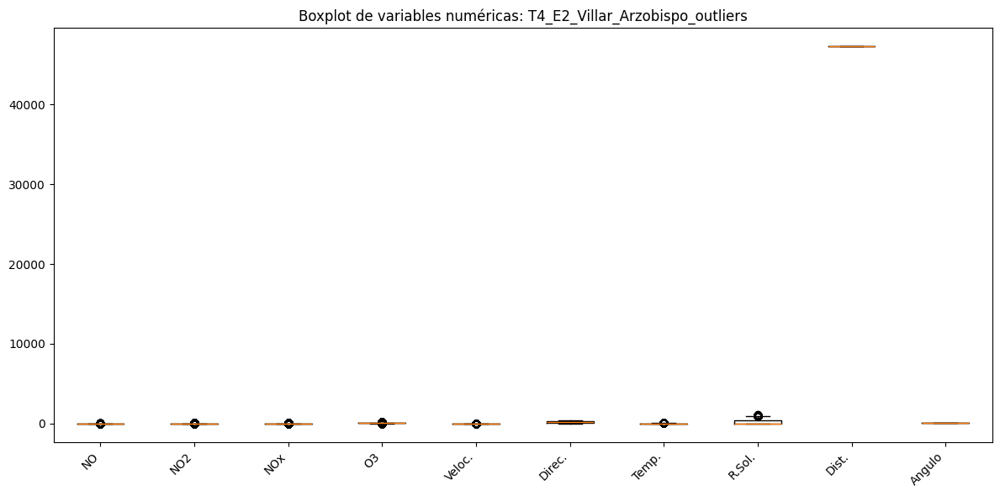


REVISIÓN DE: T6_E1_Castellon_outliers

Dimensiones:
(169048, 13)

Primeras filas:
              datetime    NO    NO2    NOx     O3  Veloc.  Direc.  Temp.  \
0  2006-01-01 01:00:00  2.75   6.75   9.75  42.75   2.575  249.00  13.30   
1  2006-01-01 02:00:00  3.00  10.00  13.50  42.00   2.650  252.50  13.55   
2  2006-01-01 03:00:00  3.00   7.25  11.00  47.00   2.750  248.25  13.35   
3  2006-01-01 04:00:00  3.00   7.25  10.75  46.25   2.525  267.25  13.05   
4  2006-01-01 05:00:00  2.75   8.00  11.00  47.25   2.175  271.50  13.15   

   R.Sol.    Estacion    Transecto   Dist.  Angulo  
0    0.00  Estacion 1  Transecto 6  3730.0   120.0  
1    0.00  Estacion 1  Transecto 6  3730.0   120.0  
2    0.00  Estacion 1  Transecto 6  3730.0   120.0  
3    0.25  Estacion 1  Transecto 6  3730.0   120.0  
4    0.25  Estacion 1  Transecto 6  3730.0   120.0  

Tipos de datos:
datetime      object
NO           float64
NO2          float64
NOx          float64
O3           float64
Veloc.       float64

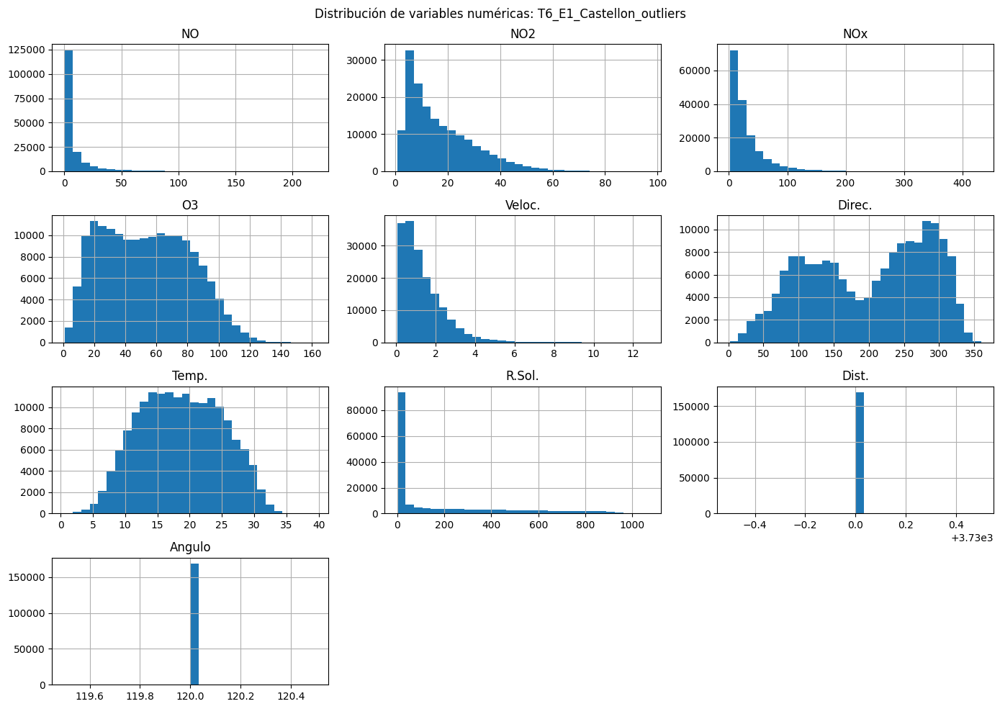

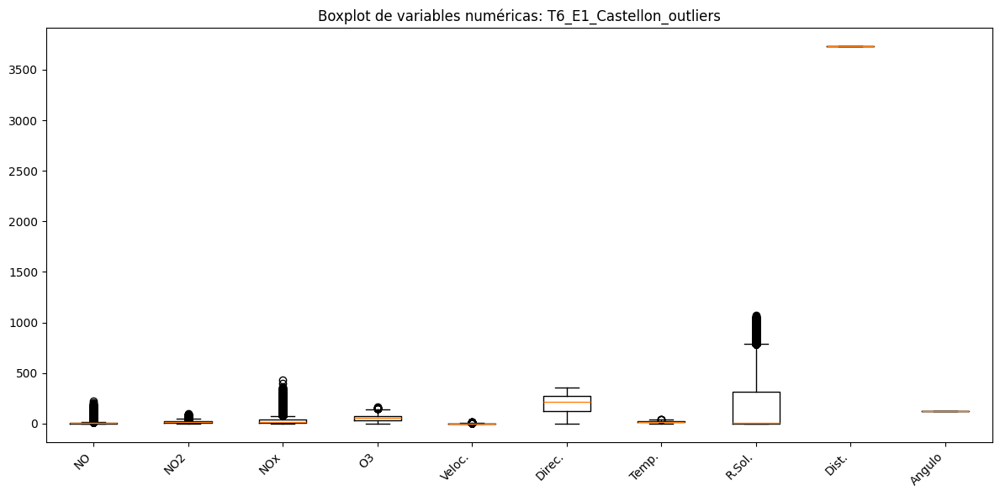


REVISIÓN DE: T6_E2_Onda_outliers

Dimensiones:
(150110, 13)

Primeras filas:
              datetime   NO  NO2  NOx    O3  Veloc.  Direc.  Temp.  R.Sol.  \
0  2025-12-31 23:00:00  1.0  2.0  2.0  37.0     0.2   262.0   11.9     0.0   
1  2025-12-31 22:00:00  1.0  3.0  4.0  34.0     0.3   207.0   11.7     0.0   
2  2025-12-31 21:00:00  1.0  4.0  5.0  32.0     0.2   207.0   11.5     0.0   
3  2025-12-31 20:00:00  1.0  5.0  6.0  37.0     0.2   189.0   11.6     0.0   
4  2025-12-31 19:00:00  1.0  5.0  7.0  23.0     0.1   271.0   11.1     0.0   

     Estacion    Transecto  Dist.  Angulo  
0  Estacion 2  Transecto 6  18300      90  
1  Estacion 2  Transecto 6  18300      90  
2  Estacion 2  Transecto 6  18300      90  
3  Estacion 2  Transecto 6  18300      90  
4  Estacion 2  Transecto 6  18300      90  

Tipos de datos:
datetime      object
NO           float64
NO2          float64
NOx          float64
O3           float64
Veloc.       float64
Direc.       float64
Temp.        float64
R.So

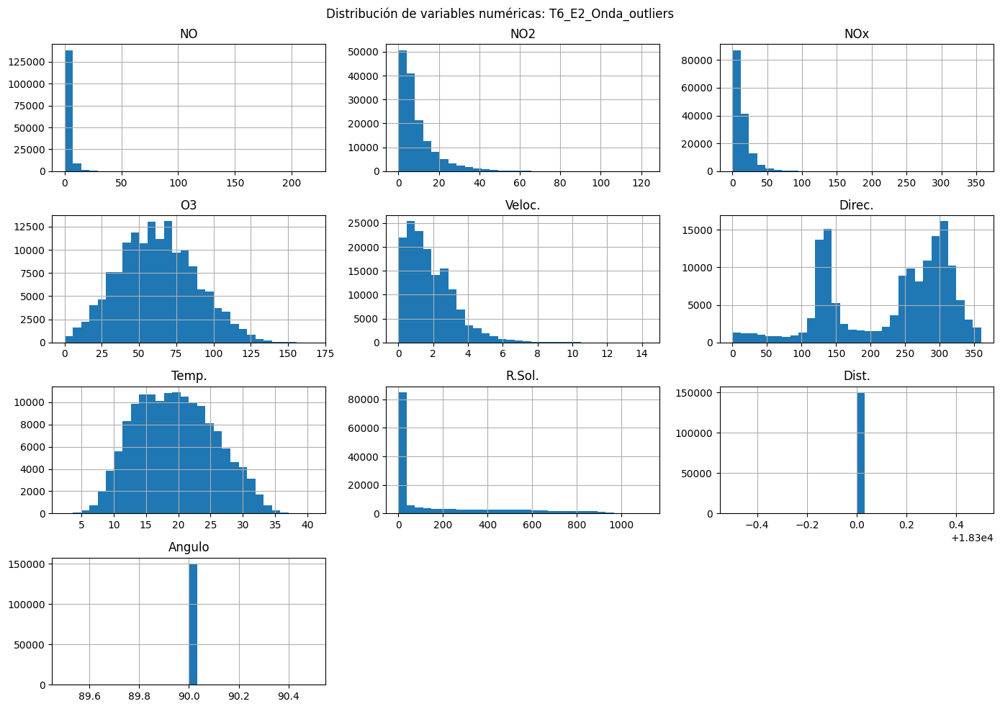

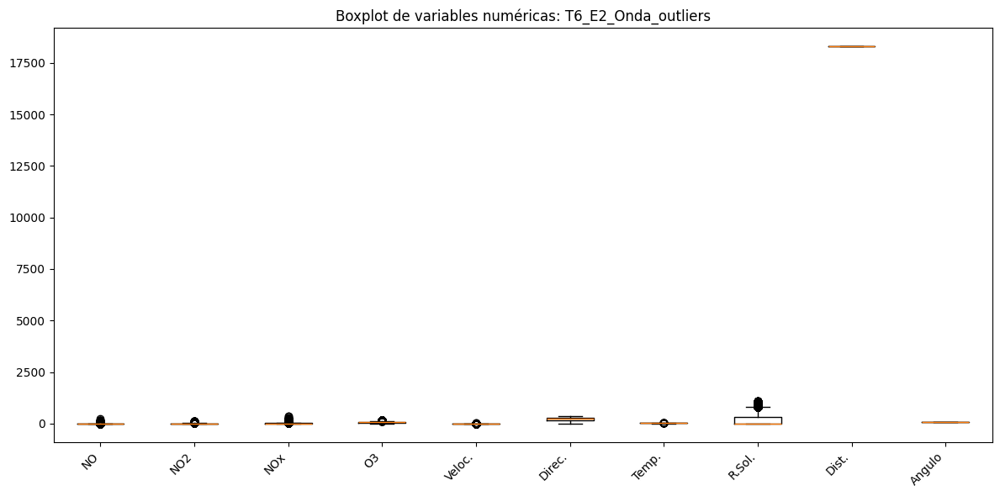


REVISIÓN DE: T7_E1_Sant_Jordi_outliers

Dimensiones:
(127138, 13)

Primeras filas:
              datetime   NO  NO2  NOx    O3  Veloc.  Direc.  Temp.  R.Sol.  \
0  2025-12-31 23:00:00  1.0  2.0  4.0  37.0     0.6   340.0    7.0     1.0   
1  2025-12-31 22:00:00  1.0  3.0  4.0  37.0     0.2   349.0    7.4     1.0   
2  2025-12-31 21:00:00  1.0  3.0  5.0  35.0     0.4   353.0    7.6     1.0   
3  2025-12-31 20:00:00  1.0  4.0  5.0  35.0     0.4   345.0    7.8     1.0   
4  2025-12-31 19:00:00  1.0  4.0  6.0  33.0     0.8   347.0    7.5     1.0   

     Estacion    Transecto  Dist.  Angulo  
0  Estacion 1  Transecto 7  12600   118.5  
1  Estacion 1  Transecto 7  12600   118.5  
2  Estacion 1  Transecto 7  12600   118.5  
3  Estacion 1  Transecto 7  12600   118.5  
4  Estacion 1  Transecto 7  12600   118.5  

Tipos de datos:
datetime      object
NO           float64
NO2          float64
NOx          float64
O3           float64
Veloc.       float64
Direc.       float64
Temp.        float6

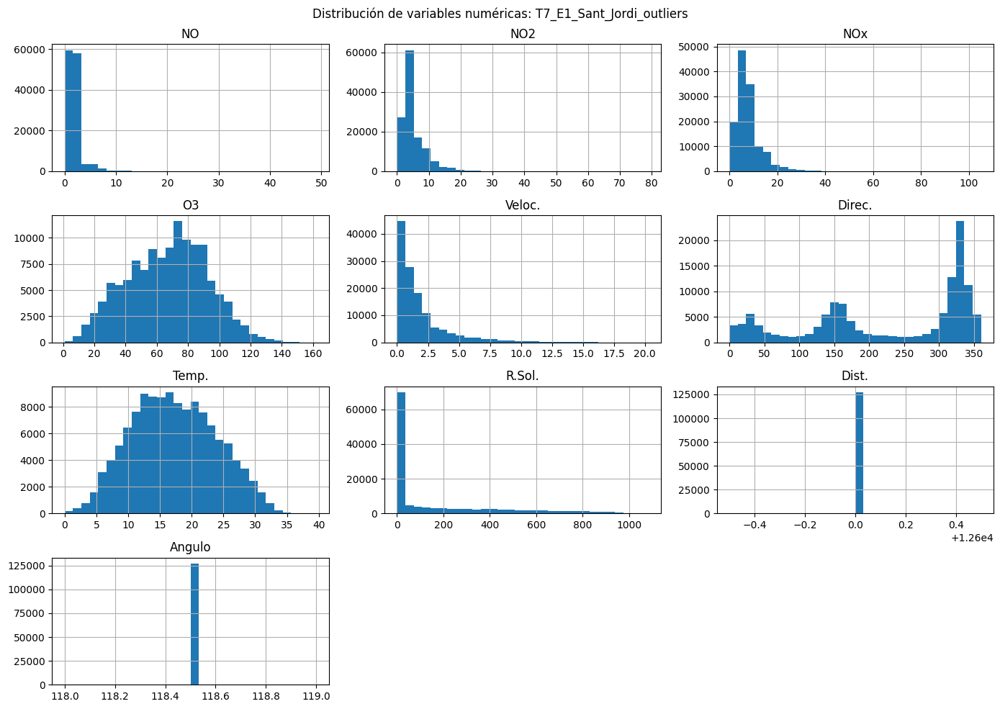

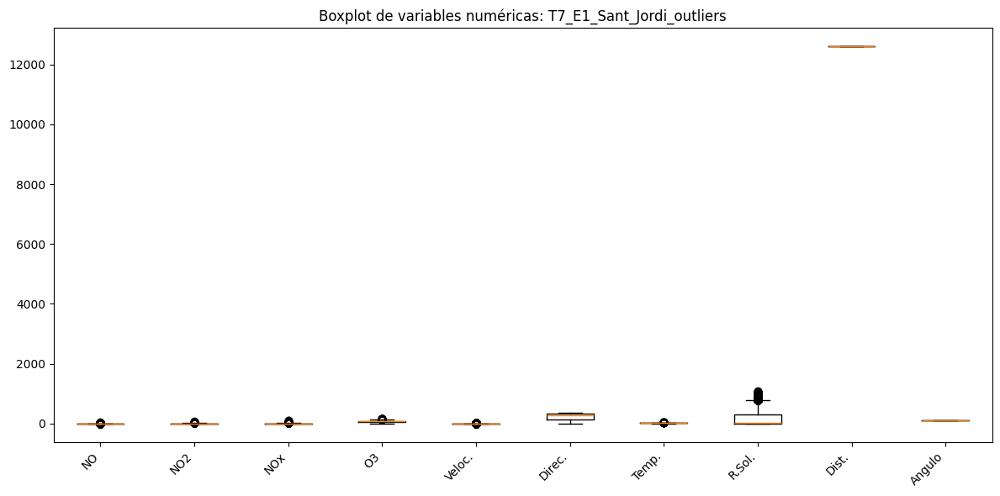


REVISIÓN DE: T7_E2_Coratxa_outliers

Dimensiones:
(113645, 13)

Primeras filas:
              datetime   NO  NO2  NOx    O3  Veloc.  Direc.  Temp.  R.Sol.  \
0  2025-12-31 08:00:00  1.0  5.0  6.0  61.0     1.6   352.0    1.0     2.0   
1  2025-12-31 07:00:00  1.0  5.0  6.0  62.0     1.4   356.0    1.1     0.0   
2  2025-12-31 06:00:00  1.0  5.0  6.0  61.0     1.8   351.0    1.2     0.0   
3  2025-12-31 05:00:00  1.0  5.0  7.0  61.0     1.9   335.0    1.2     0.0   
4  2025-12-31 04:00:00  1.0  4.0  6.0  63.0     2.7   338.0    1.6     0.0   

     Estacion    Transecto  Dist.  Angulo  
0  Estacion 2  Transecto 7  28700     120  
1  Estacion 2  Transecto 7  28700     120  
2  Estacion 2  Transecto 7  28700     120  
3  Estacion 2  Transecto 7  28700     120  
4  Estacion 2  Transecto 7  28700     120  

Tipos de datos:
datetime      object
NO           float64
NO2          float64
NOx          float64
O3           float64
Veloc.       float64
Direc.       float64
Temp.        float64
R

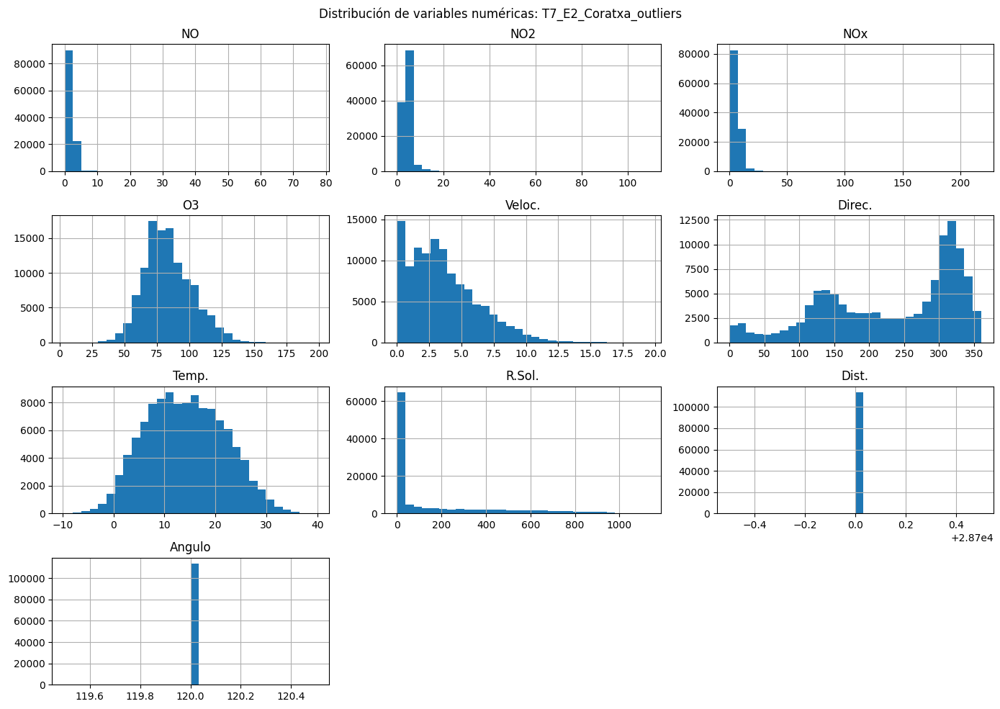

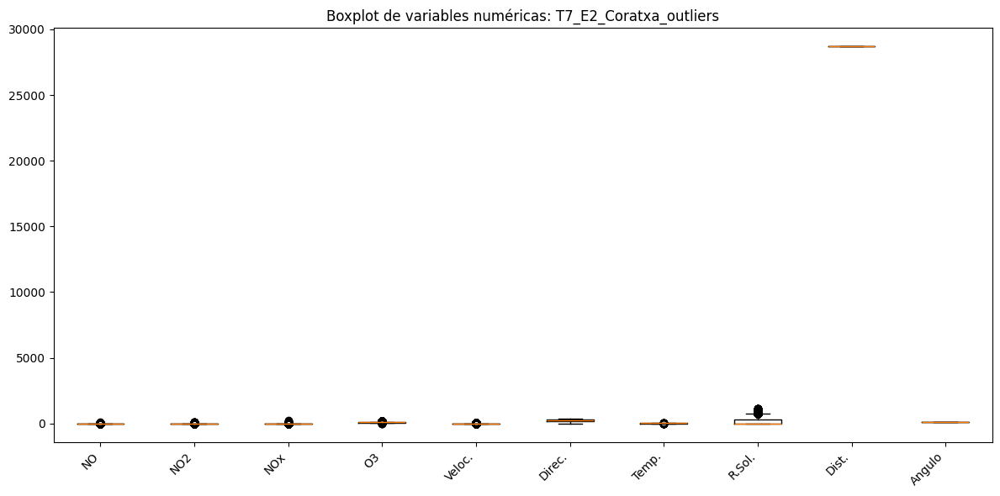


REVISIÓN DE: T7_E3_Zorita_outliers

Dimensiones:
(118416, 13)

Primeras filas:
              datetime   NO  NO2  NOx    O3  Veloc.  Direc.  Temp.  R.Sol.  \
0  2025-12-31 21:00:00  1.0  5.0  7.0  13.0     0.2   216.0   -2.6     1.0   
1  2025-12-31 20:00:00  1.0  5.0  7.0  17.0     0.2   219.0   -1.9     0.0   
2  2025-12-31 19:00:00  1.0  4.0  7.0  23.0     0.2   210.0   -1.1     0.0   
3  2025-12-31 18:00:00  2.0  4.0  7.0  35.0     0.2   191.0    0.4     0.0   
4  2025-12-31 17:00:00  2.0  4.0  7.0  58.0     0.8    18.0    3.5    11.0   

     Estacion    Transecto  Dist.  Angulo  
0  Estacion 3  Transecto 7  21900   102.1  
1  Estacion 3  Transecto 7  21900   102.1  
2  Estacion 3  Transecto 7  21900   102.1  
3  Estacion 3  Transecto 7  21900   102.1  
4  Estacion 3  Transecto 7  21900   102.1  

Tipos de datos:
datetime      object
NO           float64
NO2          float64
NOx          float64
O3           float64
Veloc.       float64
Direc.       float64
Temp.        float64
R.

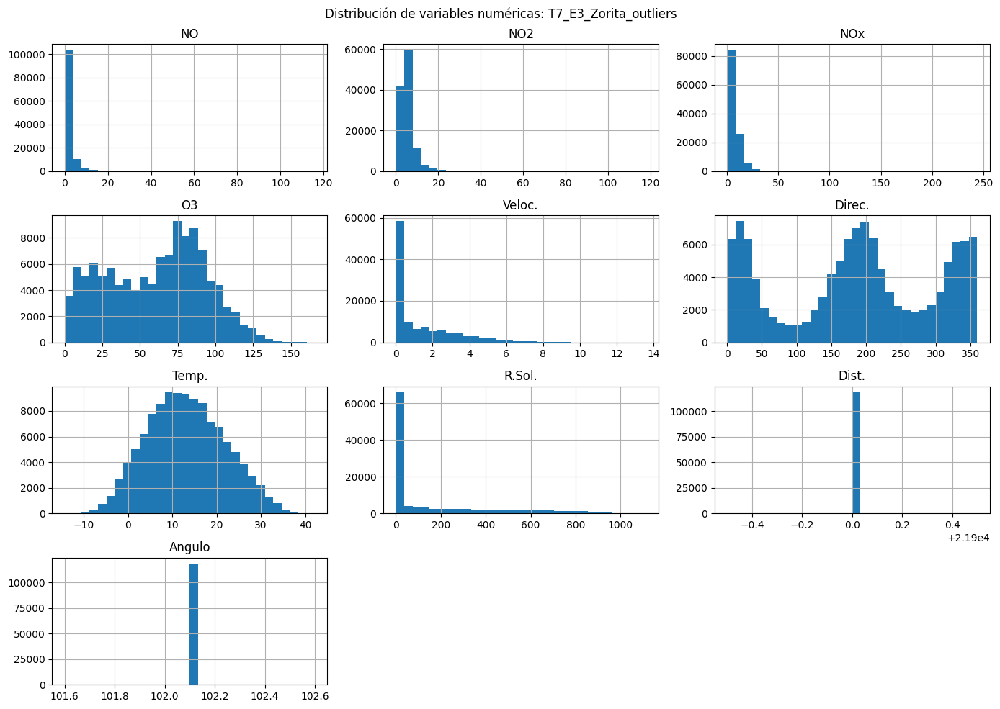

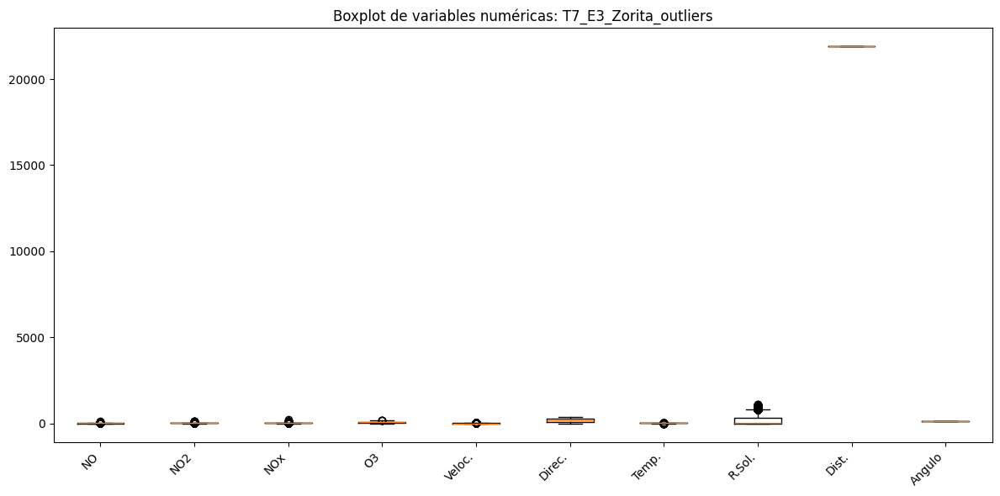


REVISIÓN DE: T8_E1_Sant_Jordi_outliers

Dimensiones:
(127138, 13)

Primeras filas:
              datetime   NO  NO2  NOx    O3  Veloc.  Direc.  Temp.  R.Sol.  \
0  2025-12-31 23:00:00  1.0  2.0  4.0  37.0     0.6   340.0    7.0     1.0   
1  2025-12-31 22:00:00  1.0  3.0  4.0  37.0     0.2   349.0    7.4     1.0   
2  2025-12-31 21:00:00  1.0  3.0  5.0  35.0     0.4   353.0    7.6     1.0   
3  2025-12-31 20:00:00  1.0  4.0  5.0  35.0     0.4   345.0    7.8     1.0   
4  2025-12-31 19:00:00  1.0  4.0  6.0  33.0     0.8   347.0    7.5     1.0   

     Estacion    Transecto  Dist.  Angulo  
0  Estacion 1  Transecto 8  12600   118.5  
1  Estacion 1  Transecto 8  12600   118.5  
2  Estacion 1  Transecto 8  12600   118.5  
3  Estacion 1  Transecto 8  12600   118.5  
4  Estacion 1  Transecto 8  12600   118.5  

Tipos de datos:
datetime      object
NO           float64
NO2          float64
NOx          float64
O3           float64
Veloc.       float64
Direc.       float64
Temp.        float6

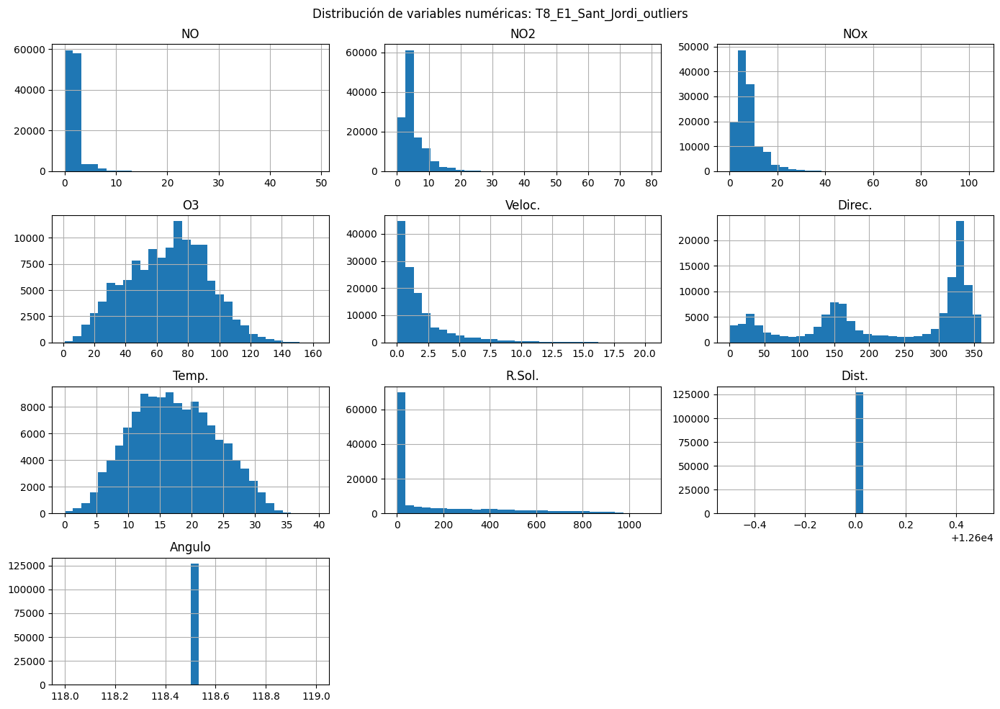

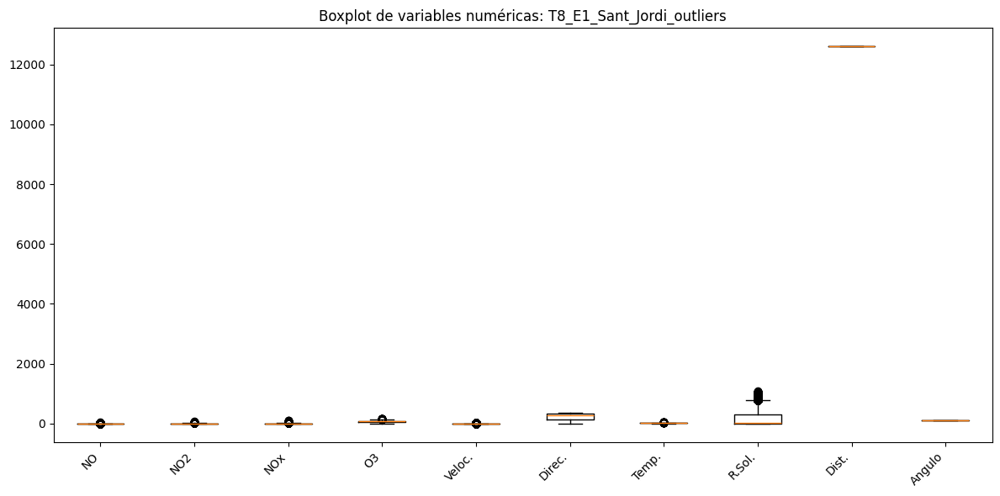


REVISIÓN DE: T8_E2_Morella_outliers

Dimensiones:
(117313, 13)

Primeras filas:
              datetime   NO  NO2  NOx    O3  Veloc.  Direc.  Temp.  R.Sol.  \
0  2025-12-31 23:00:00  2.0  3.0  5.0  52.0     1.7   154.0    4.2     0.0   
1  2025-12-31 22:00:00  2.0  3.0  5.0  52.0     1.4   140.0    4.4     0.0   
2  2025-12-31 21:00:00  2.0  3.0  5.0  54.0     1.2   135.0    4.4     0.0   
3  2025-12-31 20:00:00  2.0  3.0  6.0  57.0     0.7   141.0    4.4     0.0   
4  2025-12-31 19:00:00  2.0  3.0  6.0  57.0     0.1   169.0    5.0     0.0   

     Estacion    Transecto  Dist.  Angulo  
0  Estacion 2  Transecto 8  40300   102.6  
1  Estacion 2  Transecto 8  40300   102.6  
2  Estacion 2  Transecto 8  40300   102.6  
3  Estacion 2  Transecto 8  40300   102.6  
4  Estacion 2  Transecto 8  40300   102.6  

Tipos de datos:
datetime      object
NO           float64
NO2          float64
NOx          float64
O3           float64
Veloc.       float64
Direc.       float64
Temp.        float64
R

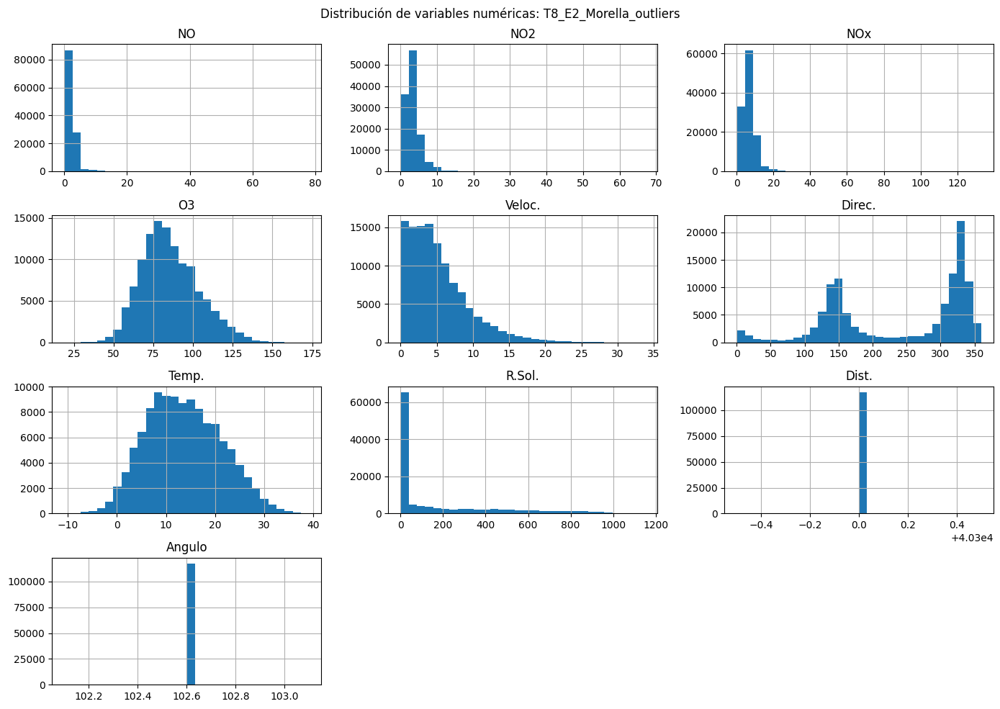

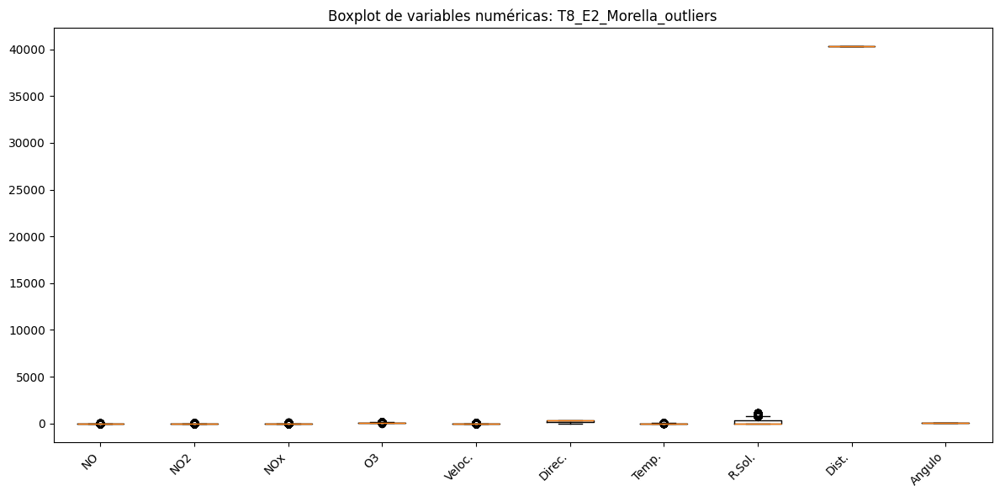


REVISIÓN DE: T8_E3_Zorita_outliers

Dimensiones:
(118416, 13)

Primeras filas:
              datetime   NO  NO2  NOx    O3  Veloc.  Direc.  Temp.  R.Sol.  \
0  2025-12-31 21:00:00  1.0  5.0  7.0  13.0     0.2   216.0   -2.6     1.0   
1  2025-12-31 20:00:00  1.0  5.0  7.0  17.0     0.2   219.0   -1.9     0.0   
2  2025-12-31 19:00:00  1.0  4.0  7.0  23.0     0.2   210.0   -1.1     0.0   
3  2025-12-31 18:00:00  2.0  4.0  7.0  35.0     0.2   191.0    0.4     0.0   
4  2025-12-31 17:00:00  2.0  4.0  7.0  58.0     0.8    18.0    3.5    11.0   

     Estacion    Transecto  Dist.  Angulo  
0  Estacion 3  Transecto 8  12600   148.2  
1  Estacion 3  Transecto 8  12600   148.2  
2  Estacion 3  Transecto 8  12600   148.2  
3  Estacion 3  Transecto 8  12600   148.2  
4  Estacion 3  Transecto 8  12600   148.2  

Tipos de datos:
datetime      object
NO           float64
NO2          float64
NOx          float64
O3           float64
Veloc.       float64
Direc.       float64
Temp.        float64
R.

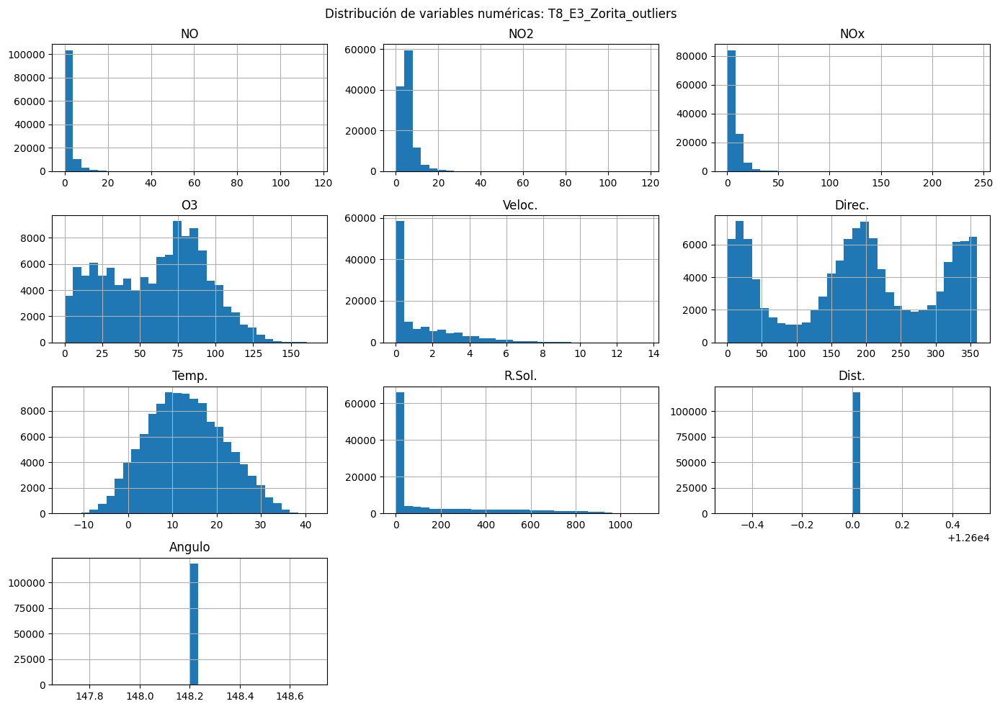

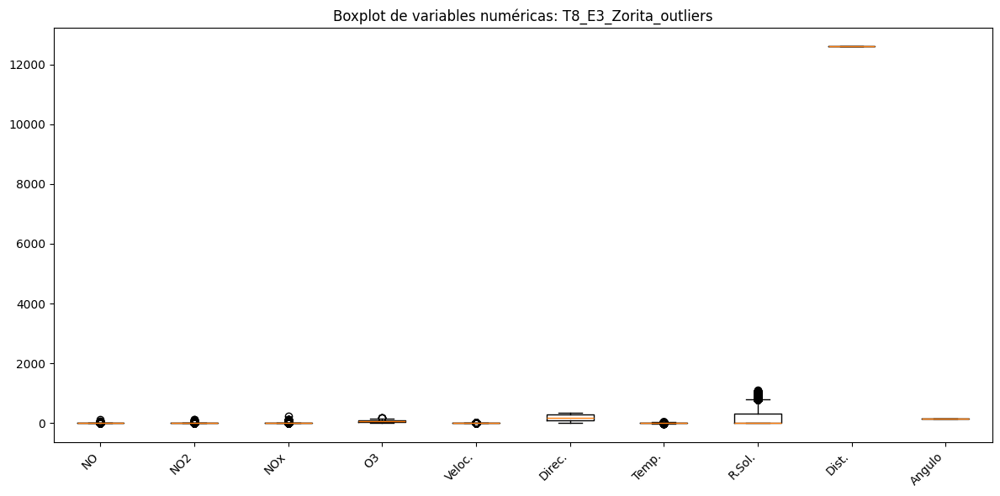


RESUMEN GLOBAL
                             nombre   filas  columnas  duplicados_filas  \
0           T1_E1_Alicante_outliers  138250        13                 0   
1               T1_E2_Elda_outliers   56160        13                 0   
2              T2_E1_Elche_outliers  127239        13                 0   
3               T2_E2_Elda_outliers   56160        13                 0   
4           T3_E1_Valencia_outliers  128949        13                 0   
5              T3_E2_Buñol_outliers  108174        13                 0   
6           T4_E1_Valencia_outliers  128949        13                 0   
7   T4_E2_Villar_Arzobispo_outliers  119163        13                 0   
8          T6_E1_Castellon_outliers  169048        13                 0   
9               T6_E2_Onda_outliers  150110        13                 0   
10        T7_E1_Sant_Jordi_outliers  127138        13                 0   
11           T7_E2_Coratxa_outliers  113645        13                 0   
12       

/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T1_E2_Elda_outliers vs T4_E1_Valencia_outliers: 0 filas idénticas en común
T1_E2_Elda_outliers vs T4_E2_Villar_Arzobispo_outliers: 0 filas idénticas en común
T1_E2_Elda_outliers vs T6_E1_Castellon_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T1_E2_Elda_outliers vs T6_E2_Onda_outliers: 0 filas idénticas en común
T1_E2_Elda_outliers vs T7_E1_Sant_Jordi_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T1_E2_Elda_outliers vs T7_E2_Coratxa_outliers: 0 filas idénticas en común
T1_E2_Elda_outliers vs T7_E3_Zorita_outliers: 0 filas idénticas en común
T1_E2_Elda_outliers vs T8_E1_Sant_Jordi_outliers: 0 filas idénticas en común
T1_E2_Elda_outliers vs T8_E2_Morella_outliers: 0 filas idénticas en común
T1_E2_Elda_outliers vs T8_E3_Zorita_outliers: 0 filas idénticas en común
T2_E1_Elche_outliers vs T2_E2_Elda_outliers: 0 filas idénticas en común
T2_E1_Elche_outliers vs T3_E1_Valencia_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T2_E1_Elche_outliers vs T3_E2_Buñol_outliers: 0 filas idénticas en común
T2_E1_Elche_outliers vs T4_E1_Valencia_outliers: 0 filas idénticas en común
T2_E1_Elche_outliers vs T4_E2_Villar_Arzobispo_outliers: 0 filas idénticas en común
T2_E1_Elche_outliers vs T6_E1_Castellon_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T2_E1_Elche_outliers vs T6_E2_Onda_outliers: 0 filas idénticas en común
T2_E1_Elche_outliers vs T7_E1_Sant_Jordi_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T2_E1_Elche_outliers vs T7_E2_Coratxa_outliers: 0 filas idénticas en común
T2_E1_Elche_outliers vs T7_E3_Zorita_outliers: 0 filas idénticas en común
T2_E1_Elche_outliers vs T8_E1_Sant_Jordi_outliers: 0 filas idénticas en común
T2_E1_Elche_outliers vs T8_E2_Morella_outliers: 0 filas idénticas en común
T2_E1_Elche_outliers vs T8_E3_Zorita_outliers: 0 filas idénticas en común
T2_E2_Elda_outliers vs T3_E1_Valencia_outliers: 0 filas idénticas en común
T2_E2_Elda_outliers vs T3_E2_Buñol_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T2_E2_Elda_outliers vs T4_E1_Valencia_outliers: 0 filas idénticas en común
T2_E2_Elda_outliers vs T4_E2_Villar_Arzobispo_outliers: 0 filas idénticas en común
T2_E2_Elda_outliers vs T6_E1_Castellon_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T2_E2_Elda_outliers vs T6_E2_Onda_outliers: 0 filas idénticas en común
T2_E2_Elda_outliers vs T7_E1_Sant_Jordi_outliers: 0 filas idénticas en común
T2_E2_Elda_outliers vs T7_E2_Coratxa_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T2_E2_Elda_outliers vs T7_E3_Zorita_outliers: 0 filas idénticas en común
T2_E2_Elda_outliers vs T8_E1_Sant_Jordi_outliers: 0 filas idénticas en común
T2_E2_Elda_outliers vs T8_E2_Morella_outliers: 0 filas idénticas en común
T2_E2_Elda_outliers vs T8_E3_Zorita_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T3_E1_Valencia_outliers vs T3_E2_Buñol_outliers: 0 filas idénticas en común
T3_E1_Valencia_outliers vs T4_E1_Valencia_outliers: 0 filas idénticas en común
T3_E1_Valencia_outliers vs T4_E2_Villar_Arzobispo_outliers: 0 filas idénticas en común
T3_E1_Valencia_outliers vs T6_E1_Castellon_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T3_E1_Valencia_outliers vs T6_E2_Onda_outliers: 0 filas idénticas en común
T3_E1_Valencia_outliers vs T7_E1_Sant_Jordi_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T3_E1_Valencia_outliers vs T7_E2_Coratxa_outliers: 0 filas idénticas en común
T3_E1_Valencia_outliers vs T7_E3_Zorita_outliers: 0 filas idénticas en común
T3_E1_Valencia_outliers vs T8_E1_Sant_Jordi_outliers: 0 filas idénticas en común
T3_E1_Valencia_outliers vs T8_E2_Morella_outliers: 0 filas idénticas en común
T3_E1_Valencia_outliers vs T8_E3_Zorita_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T3_E2_Buñol_outliers vs T4_E1_Valencia_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T3_E2_Buñol_outliers vs T4_E2_Villar_Arzobispo_outliers: 0 filas idénticas en común
T3_E2_Buñol_outliers vs T6_E1_Castellon_outliers: 0 filas idénticas en común
T3_E2_Buñol_outliers vs T6_E2_Onda_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T3_E2_Buñol_outliers vs T7_E1_Sant_Jordi_outliers: 0 filas idénticas en común
T3_E2_Buñol_outliers vs T7_E2_Coratxa_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T3_E2_Buñol_outliers vs T7_E3_Zorita_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T3_E2_Buñol_outliers vs T8_E1_Sant_Jordi_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T3_E2_Buñol_outliers vs T8_E2_Morella_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T3_E2_Buñol_outliers vs T8_E3_Zorita_outliers: 0 filas idénticas en común
T4_E1_Valencia_outliers vs T4_E2_Villar_Arzobispo_outliers: 0 filas idénticas en común
T4_E1_Valencia_outliers vs T6_E1_Castellon_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T4_E1_Valencia_outliers vs T6_E2_Onda_outliers: 0 filas idénticas en común
T4_E1_Valencia_outliers vs T7_E1_Sant_Jordi_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T4_E1_Valencia_outliers vs T7_E2_Coratxa_outliers: 0 filas idénticas en común
T4_E1_Valencia_outliers vs T7_E3_Zorita_outliers: 0 filas idénticas en común
T4_E1_Valencia_outliers vs T8_E1_Sant_Jordi_outliers: 0 filas idénticas en común
T4_E1_Valencia_outliers vs T8_E2_Morella_outliers: 0 filas idénticas en común
T4_E1_Valencia_outliers vs T8_E3_Zorita_outliers: 0 filas idénticas en común
T4_E2_Villar_Arzobispo_outliers vs T6_E1_Castellon_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T4_E2_Villar_Arzobispo_outliers vs T6_E2_Onda_outliers: 0 filas idénticas en común
T4_E2_Villar_Arzobispo_outliers vs T7_E1_Sant_Jordi_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T4_E2_Villar_Arzobispo_outliers vs T7_E2_Coratxa_outliers: 0 filas idénticas en común
T4_E2_Villar_Arzobispo_outliers vs T7_E3_Zorita_outliers: 0 filas idénticas en común
T4_E2_Villar_Arzobispo_outliers vs T8_E1_Sant_Jordi_outliers: 0 filas idénticas en común
T4_E2_Villar_Arzobispo_outliers vs T8_E2_Morella_outliers: 0 filas idénticas en común
T4_E2_Villar_Arzobispo_outliers vs T8_E3_Zorita_outliers: 0 filas idénticas en común
T6_E1_Castellon_outliers vs T6_E2_Onda_outliers: 0 filas idénticas en común
T6_E1_Castellon_outliers vs T7_E1_Sant_Jordi_outliers: 0 filas idénticas en común
T6_E1_Castellon_outliers vs T7_E2_Coratxa_outliers: 0 filas idénticas en común
T6_E1_Castellon_outliers vs T7_E3_Zorita_outliers: 0 filas idénticas en común
T6_E1_Castellon_outliers vs T8_E1_Sant_Jordi_outliers: 0 filas idénticas en común
T6_E1_Castellon_outliers vs T8_E2_Morella_outliers: 0 filas idénticas en común
T6_E1_Castellon_outliers vs T8_E3_Zorita_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T6_E2_Onda_outliers vs T7_E1_Sant_Jordi_outliers: 0 filas idénticas en común
T6_E2_Onda_outliers vs T7_E2_Coratxa_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T6_E2_Onda_outliers vs T7_E3_Zorita_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T6_E2_Onda_outliers vs T8_E1_Sant_Jordi_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T6_E2_Onda_outliers vs T8_E2_Morella_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T6_E2_Onda_outliers vs T8_E3_Zorita_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T7_E1_Sant_Jordi_outliers vs T7_E2_Coratxa_outliers: 0 filas idénticas en común
T7_E1_Sant_Jordi_outliers vs T7_E3_Zorita_outliers: 0 filas idénticas en común
T7_E1_Sant_Jordi_outliers vs T8_E1_Sant_Jordi_outliers: 0 filas idénticas en común
T7_E1_Sant_Jordi_outliers vs T8_E2_Morella_outliers: 0 filas idénticas en común
T7_E1_Sant_Jordi_outliers vs T8_E3_Zorita_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T7_E2_Coratxa_outliers vs T7_E3_Zorita_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T7_E2_Coratxa_outliers vs T8_E1_Sant_Jordi_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T7_E2_Coratxa_outliers vs T8_E2_Morella_outliers: 0 filas idénticas en común


/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1784871348.py:116: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  comunes = pd.merge(


T7_E2_Coratxa_outliers vs T8_E3_Zorita_outliers: 0 filas idénticas en común
T7_E3_Zorita_outliers vs T8_E1_Sant_Jordi_outliers: 0 filas idénticas en común
T7_E3_Zorita_outliers vs T8_E2_Morella_outliers: 0 filas idénticas en común
T7_E3_Zorita_outliers vs T8_E3_Zorita_outliers: 0 filas idénticas en común
T8_E1_Sant_Jordi_outliers vs T8_E2_Morella_outliers: 0 filas idénticas en común
T8_E1_Sant_Jordi_outliers vs T8_E3_Zorita_outliers: 0 filas idénticas en común
T8_E2_Morella_outliers vs T8_E3_Zorita_outliers: 0 filas idénticas en común


In [11]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


def cargar_archivo(ruta):
    ruta = Path(ruta)
    ext = ruta.suffix.lower()

    if ext == ".csv":
        return pd.read_csv(ruta)
    elif ext in [".xlsx", ".xls"]:
        return pd.read_excel(ruta)
    elif ext == ".parquet":
        return pd.read_parquet(ruta)
    elif ext == ".txt":
        return pd.read_csv(ruta, sep=None, engine="python")
    else:
        raise ValueError(f"Formato no soportado: {ext} en {ruta}")


def revisar_dataframe(df, nombre="archivo", mostrar_graficos=True):
    print(f"\n{'=' * 80}")
    print(f"REVISIÓN DE: {nombre}")
    print(f"{'=' * 80}")

    print("\nDimensiones:")
    print(df.shape)

    print("\nPrimeras filas:")
    print(df.head())

    print("\nTipos de datos:")
    print(df.dtypes)

    duplicados_filas = df.duplicated().sum()
    print(f"\nFilas duplicadas: {duplicados_filas}")

    nulos = df.isna().sum()
    porc_nulos = (nulos / len(df)) * 100 if len(df) > 0 else nulos * 0

    resumen_nulos = pd.DataFrame({
        "nulos": nulos,
        "porcentaje": porc_nulos
    }).sort_values("nulos", ascending=False)

    print("\nValores nulos por columna:")
    print(resumen_nulos[resumen_nulos["nulos"] > 0])

    print("\nResumen estadístico de columnas numéricas:")
    print(df.describe(include=[np.number]).T)

    columnas_numericas = df.select_dtypes(include=[np.number]).columns.tolist()
    columnas_categoricas = df.select_dtypes(exclude=[np.number]).columns.tolist()

    print("\nColumnas numéricas:")
    print(columnas_numericas)

    print("\nColumnas no numéricas:")
    print(columnas_categoricas)

    if mostrar_graficos and len(columnas_numericas) > 0:
        df[columnas_numericas].hist(bins=30, figsize=(14, 10))
        plt.suptitle(f"Distribución de variables numéricas: {nombre}")
        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(12, 6))
        plt.boxplot([df[col].dropna() for col in columnas_numericas], tick_labels=columnas_numericas)
        plt.xticks(rotation=45, ha="right")
        plt.title(f"Boxplot de variables numéricas: {nombre}")
        plt.tight_layout()
        plt.show()

    return {
        "nombre": nombre,
        "filas": df.shape[0],
        "columnas": df.shape[1],
        "duplicados_filas": duplicados_filas,
        "nulos_por_columna": nulos,
        "porcentaje_nulos_por_columna": porc_nulos
    }


def revisar_varios_archivos(rutas, mostrar_graficos=True):
    resumenes = []
    dfs = {}

    for ruta in rutas:
        nombre = Path(ruta).stem
        try:
            df = cargar_archivo(ruta)
            dfs[nombre] = df
            resumen = revisar_dataframe(df, nombre=nombre, mostrar_graficos=mostrar_graficos)
            resumen["ruta"] = str(ruta)
            resumenes.append(resumen)
        except Exception as e:
            print(f"\nError al leer {ruta}: {e}")

    resumen_final = pd.DataFrame(resumenes)

    print("\n" + "=" * 80)
    print("RESUMEN GLOBAL")
    print("=" * 80)
    print(resumen_final)

    if len(dfs) > 1:
        print("\nComprobación de duplicados entre archivos según filas completas:")
        nombres = list(dfs.keys())
        for i in range(len(nombres)):
            for j in range(i + 1, len(nombres)):
                df1 = dfs[nombres[i]]
                df2 = dfs[nombres[j]]

                comunes = pd.merge(
                    df1.drop_duplicates(),
                    df2.drop_duplicates(),
                    how="inner"
                )
                print(f"{nombres[i]} vs {nombres[j]}: {len(comunes)} filas idénticas en común")

    return resumen_final, dfs


# Ejemplo de uso
rutas = [
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/Finales/T1_E1_Alicante_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/Finales/T1_E2_Elda_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/Finales/T2_E1_Elche_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/Finales/T2_E2_Elda_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/Finales/T3_E1_Valencia_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/Finales/T3_E2_Buñol_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/Finales/T4_E1_Valencia_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/Finales/T4_E2_Villar_Arzobispo_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/Finales/T6_E1_Castellon_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/Finales/T6_E2_Onda_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/Finales/T7_E1_Sant_Jordi_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/Finales/T7_E2_Coratxa_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/Finales/T7_E3_Zorita_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/Finales/T8_E1_Sant_Jordi_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/Finales/T8_E2_Morella_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/Finales/T8_E3_Zorita_outliers.csv"
]

resumen, dataframes = revisar_varios_archivos(rutas, mostrar_graficos=True)

In [ ]:
rutas = [
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T1_E1_Alicante_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T1_E2_Elda_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T2_E1_Elche_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T2_E2_Elda_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T3_E1_Valencia_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T3_E2_Buñol_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T4_E1_Valencia_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T4_E2_Villar_Arzobispo_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T6_E1_Castellon_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T6_E2_Onda_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T7_E1_Sant_Jordi_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T7_E2_Coratxa_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T7_E3_Zorita_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T8_E1_Sant_Jordi_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T8_E2_Morella_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T8_E3_Zorita_outliers_clean.csv"
]

# Eliminar duplicados

In [5]:
from pathlib import Path
import pandas as pd


def limpiar_columnas(df):
    df.columns = (
        df.columns
        .str.strip()
        .str.lower()
        .str.replace(" ", "_")
    )
    return df


def detectar_columna_datetime(df):
    posibles = [c for c in df.columns if "fecha" in c or "date" in c or "time" in c]
    
    if len(posibles) == 0:
        raise ValueError("No se ha encontrado columna temporal")
    
    return posibles[0]  # toma la primera candidata


def procesar_archivo(ruta, guardar=True, carpeta_salida=None):
    ruta = Path(ruta)
    df = pd.read_csv(ruta)

    df = limpiar_columnas(df)

    col_time = detectar_columna_datetime(df)

    # Conversión a datetime
    df[col_time] = pd.to_datetime(df[col_time], errors="coerce")

    n_antes = len(df)

    # Eliminar duplicados por datetime
    df_clean = df.drop_duplicates(subset=[col_time])

    n_despues = len(df_clean)
    eliminadas = n_antes - n_despues

    print("\n" + "="*60)
    print(f"Archivo: {ruta.name}")
    print(f"Columna temporal usada: {col_time}")
    print(f"Filas antes: {n_antes}")
    print(f"Filas después: {n_despues}")
    print(f"Duplicados eliminados: {eliminadas}")

    # Guardado
    if guardar:
        if carpeta_salida is None:
            carpeta_salida = ruta.parent / "clean"
        
        carpeta_salida = Path(carpeta_salida)
        carpeta_salida.mkdir(exist_ok=True)

        ruta_salida = carpeta_salida / f"{ruta.stem}_clean.csv"
        df_clean.to_csv(ruta_salida, index=False)

    return {
        "archivo": ruta.name,
        "filas_antes": n_antes,
        "filas_despues": n_despues,
        "eliminadas": eliminadas
    }


def procesar_varios_archivos(rutas):
    resumen = []

    for ruta in rutas:
        try:
            info = procesar_archivo(ruta)
            resumen.append(info)
        except Exception as e:
            print(f"\nError en {ruta}: {e}")

    resumen_df = pd.DataFrame(resumen)

    print("\n" + "="*60)
    print("RESUMEN GLOBAL")
    print("="*60)
    print(resumen_df)

    return resumen_df


# USO
rutas = [
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T1_E1_Alicante_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T1_E2_Elda_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T2_E1_Elche_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T2_E2_Elda_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T3_E1_Valencia_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T3_E2_Buñol_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T4_E1_Valencia_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T4_E2_Villar_Arzobispo_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T6_E1_Castellon_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T6_E2_Onda_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T7_E1_Sant_Jordi_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T7_E2_Coratxa_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T7_E3_Zorita_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T8_E1_Sant_Jordi_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T8_E2_Morella_outliers_clean.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/T8_E3_Zorita_outliers_clean.csv"
]

resumen = procesar_varios_archivos(rutas)


Archivo: T1_E1_Alicante_outliers_clean.csv
Columna temporal usada: datetime
Filas antes: 138250
Filas después: 138250
Duplicados eliminados: 0

Archivo: T1_E2_Elda_outliers_clean.csv
Columna temporal usada: datetime
Filas antes: 56160
Filas después: 56160
Duplicados eliminados: 0

Archivo: T2_E1_Elche_outliers_clean.csv
Columna temporal usada: datetime
Filas antes: 127239
Filas después: 127239
Duplicados eliminados: 0

Archivo: T2_E2_Elda_outliers_clean.csv
Columna temporal usada: datetime
Filas antes: 56160
Filas después: 56160
Duplicados eliminados: 0

Archivo: T3_E1_Valencia_outliers_clean.csv
Columna temporal usada: datetime
Filas antes: 128949
Filas después: 128949
Duplicados eliminados: 0

Archivo: T3_E2_Buñol_outliers_clean.csv
Columna temporal usada: datetime
Filas antes: 108174
Filas después: 108174
Duplicados eliminados: 0

Archivo: T4_E1_Valencia_outliers_clean.csv
Columna temporal usada: datetime
Filas antes: 128949
Filas después: 128949
Duplicados eliminados: 0

Archivo:

/var/folders/85/2m2sr7rx6g5d561zn04dcq000000gn/T/ipykernel_32269/1247591044.py:33: UserWarning: Parsing dates in %d/%m/%Y %H:%M format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df[col_time] = pd.to_datetime(df[col_time], errors="coerce")



Archivo: T7_E2_Coratxa_outliers_clean.csv
Columna temporal usada: datetime
Filas antes: 119264
Filas después: 113645
Duplicados eliminados: 5619

Archivo: T7_E3_Zorita_outliers_clean.csv
Columna temporal usada: datetime
Filas antes: 125504
Filas después: 118416
Duplicados eliminados: 7088

Archivo: T8_E1_Sant_Jordi_outliers_clean.csv
Columna temporal usada: datetime
Filas antes: 133495
Filas después: 127138
Duplicados eliminados: 6357

Archivo: T8_E2_Morella_outliers_clean.csv
Columna temporal usada: datetime
Filas antes: 123186
Filas después: 117313
Duplicados eliminados: 5873

Archivo: T8_E3_Zorita_outliers_clean.csv
Columna temporal usada: datetime
Filas antes: 125504
Filas después: 118416
Duplicados eliminados: 7088

RESUMEN GLOBAL
                                      archivo  filas_antes  filas_despues  \
0           T1_E1_Alicante_outliers_clean.csv       138250         138250   
1               T1_E2_Elda_outliers_clean.csv        56160          56160   
2              T2_E1_E

# Renombrar nombres variables

In [6]:
import os
import pandas as pd

# Lista de rutas de los archivos a procesar
rutas = [
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T1_E1_Alicante_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T1_E2_Elda_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T2_E1_Elche_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T2_E2_Elda_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T3_E1_Valencia_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T3_E2_Buñol_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T4_E1_Valencia_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T4_E2_Villar_Arzobispo_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T6_E1_Castellon_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T6_E2_Onda_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T7_E1_Sant_Jordi_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T7_E2_Coratxa_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T7_E3_Zorita_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T8_E1_Sant_Jordi_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T8_E2_Morella_outliers.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T8_E3_Zorita_outliers.csv"
]

# Mapeo de nombres antiguos a nuevos
renombrado_columnas = {
    "datetime": "datetime",
    "no": "NO",
    "no2": "NO2",
    "nox": "NOx",
    "o3": "O3",
    "veloc.": "Veloc.",
    "direc.": "Direc.",
    "temp.": "Temp.",
    "r.sol.": "R.Sol.",
    "estacion": "Estacion",
    "transecto": "Transecto",
    "dist.": "Dist.",
    "angulo": "Angulo",
    "o3_for_impute": "O3_for_impute"
}

def normalizar_nombre(columna):
    return str(columna).strip().lower()

def renombrar_csv(ruta_entrada, sufijo="_renombrado"):
    df = pd.read_csv(ruta_entrada)

    # Crear un diccionario auxiliar que permita renombrar sin depender de mayúsculas
    columnas_originales = {normalizar_nombre(c): c for c in df.columns}

    columnas_a_renombrar = {}
    for viejo, nuevo in renombrado_columnas.items():
        if viejo in columnas_originales:
            columnas_a_renombrar[columnas_originales[viejo]] = nuevo

    df = df.rename(columns=columnas_a_renombrar)

    carpeta, nombre_archivo = os.path.split(ruta_entrada)
    nombre_base, extension = os.path.splitext(nombre_archivo)
    salida = os.path.join(carpeta, f"{nombre_base}{sufijo}{extension}")

    df.to_csv(salida, index=False, encoding="utf-8")

    return salida, list(df.columns)

# Procesar todos los archivos
for ruta in rutas:
    try:
        salida, columnas_finales = renombrar_csv(ruta)
        print(f"Archivo procesado: {ruta}")
        print(f"Guardado como: {salida}")
        print(f"Columnas finales: {columnas_finales}")
        print("-" * 60)
    except Exception as e:
        print(f"Error al procesar {ruta}: {e}")

Archivo procesado: /Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T1_E1_Alicante_outliers.csv
Guardado como: /Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T1_E1_Alicante_outliers_renombrado.csv
Columnas finales: ['datetime', 'NO', 'NO2', 'NOx', 'O3', 'Veloc.', 'Direc.', 'Temp.', 'R.Sol.', 'Estacion', 'Transecto', 'Dist.', 'Angulo', 'O3_for_impute']
------------------------------------------------------------
Archivo procesado: /Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T1_E2_Elda_outliers.csv
Guardado como: /Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T1_E2_Elda_outliers_renombrado.csv
Columnas finales: ['datetime', 'NO', 'NO2', 'NOx', 'O3', 'Veloc.', 'Direc.', 'Temp.', 'R.Sol.', 'Estacion', 'Transecto', 'Dist.', 'Angulo', 'O3_for_impute']
------------------------------------------------------------
Archivo procesado: /Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T2_E1_Elche_outliers.csv
G

# Quitar columna 03_for_impute

In [7]:
import os
import pandas as pd

# Rutas de los archivos
rutas = [
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T1_E1_Alicante_outliers_renombrado.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T1_E2_Elda_outliers_renombrado.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T2_E1_Elche_outliers_renombrado.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T2_E2_Elda_outliers_renombrado.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T3_E1_Valencia_outliers_renombrado.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T3_E2_Buñol_outliers_renombrado.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T4_E1_Valencia_outliers_renombrado.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T4_E2_Villar_Arzobispo_outliers_renombrado.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T6_E1_Castellon_outliers_renombrado.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T6_E2_Onda_outliers_renombrado.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T7_E1_Sant_Jordi_outliers_renombrado.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T7_E2_Coratxa_outliers_renombrado.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T7_E3_Zorita_outliers_renombrado.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T8_E1_Sant_Jordi_outliers_renombrado.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T8_E2_Morella_outliers_renombrado.csv",
    "/Volumes/copia seguridad1/enviar_benja/carpeta sin título/clean/T8_E3_Zorita_outliers_renombrado.csv"
]

for ruta in rutas:
    df = pd.read_csv(ruta)

    if "O3_for_impute" in df.columns:
        df = df.drop(columns=["O3_for_impute"])

    df.to_csv(ruta, index=False)